<a href="https://colab.research.google.com/github/zaeyonglee/KHUDA_DATATON_202510/blob/main/khuda_datathon_10.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

데이터 셋 분석

**모든 피처로 클러스터링 하고 PCA로 2차원 3차원 시각화**

In [ ]:
!sudo apt-get install -y fonts-nanum
!sudo fc-cache -fv
!rm ~/.cache/matplotlib -rf

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following NEW packages will be installed:
  fonts-nanum
0 upgraded, 1 newly installed, 0 to remove and 41 not upgraded.
Need to get 10.3 MB of archives.
After this operation, 34.1 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 fonts-nanum all 20200506-1 [10.3 MB]
Fetched 10.3 MB in 1s (7,027 kB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debconf/FrontEnd/Dialog.pm line 78, <> line 1.)
debconf: falling back to frontend: Readline
debconf: unable to initialize frontend: Readline
debconf: (This frontend requires a controlling tty.)
debconf: falling back to frontend: Teletype
dpkg-preconfigure: unable to re-open stdin: 
Selecting previously unselected package fonts-nanum.
(Reading database ... 121713 files and dire

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


In [ ]:
# 식품 영양성분 데이터 DB Dataframe
df1 = pd.read_csv('/content/sample_data/foodDB_중복제거.csv',
                  encoding='cp949')
df1.head()

,식품코드,식품명,데이터구분코드,데이터구분명,식품기원코드,식품기원명,식품대분류코드,식품대분류명,대표식품코드,식품중분류코드,...,출처명,식품중량,업체명,데이터생성방법코드,데이터생성방법명,데이터생성일자,데이터기준일자,단백질(g)/100kcal,탄수화물(g)/100kcal,지방(g)/100kcal
0,D101-004160000-0001,국밥_돼지머리,D,음식,1,가정식(분석 함량),1,밥류,1004,100416,...,식품의약품안전처,900g,해당없음,1,분석,2017-12-31,2025-04-08,4.89,11.64,3.77
1,D101-006000000-0001,기장밥,D,음식,1,가정식(분석 함량),1,밥류,1006,100600,...,식품의약품안전처,200g,해당없음,1,분석,2017-12-31,2025-04-08,2.07,22.15,0.34
2,D101-007000000-0001,김밥,D,음식,1,가정식(분석 함량),1,밥류,1007,100700,...,식품의약품안전처,230g,해당없음,1,분석,2018-12-31,2025-04-08,3.46,14.27,3.25
3,D101-010080000-0001,덮밥_낙지,D,음식,1,가정식(분석 함량),1,밥류,1010,101008,...,식품의약품안전처,350g,해당없음,1,분석,2017-12-31,2025-04-08,3.92,16.08,2.23
4,D101-016000000-0001,보리밥,D,음식,1,가정식(분석 함량),1,밥류,1016,101600,...,식품의약품안전처,200g,해당없음,1,분석,2017-12-31,2025-04-08,1.80,22.84,0.15


In [ ]:
df1.columns

Index(['식품코드', '식품명', '데이터구분코드', '데이터구분명', '식품기원코드', '식품기원명', '식품대분류코드',
       '식품대분류명', '대표식품코드', '식품중분류코드',
       ...
       '출처명', '식품중량', '업체명', '데이터생성방법코드', '데이터생성방법명', '데이터생성일자', '데이터기준일자',
       '단백질(g)/100kcal', '탄수화물(g)/100kcal', '지방(g)/100kcal'],
      dtype='object', length=161)

In [ ]:
df1_0_10 = df1.iloc[:, 0:10]
df1_10_20 = df1.iloc[:, 10:20]
df1_20_30 = df1.iloc[:, 20:30]
df1_30_40 = df1.iloc[:, 30:40]
df1_40_50 = df1.iloc[:, 40:50]
df1_50_60 = df1.iloc[:, 50:60]
df1_60_70 = df1.iloc[:, 60:70]
df1_70_80 = df1.iloc[:, 70:80]
df1_80_90 = df1.iloc[:, 80:90]
df1_90_100 = df1.iloc[:, 90:100]
df1_100_110 = df1.iloc[:, 100:110]
df1_110_120 = df1.iloc[:, 110:120]
df1_120_130 = df1.iloc[:, 120:130]
df1_130_140 = df1.iloc[:, 130:140]
df1_140_150 = df1.iloc[:, 140:150]
df1_150_160 = df1.iloc[:, 150:]
display(df1_0_10.head())
display(df1_10_20.head())
display(df1_20_30.head())
display(df1_30_40.head())
display(df1_40_50.head())
display(df1_50_60.head())
display(df1_60_70.head())
display(df1_70_80.head())
display(df1_80_90.head())
display(df1_90_100.head())
display(df1_100_110.head())
display(df1_110_120.head())
display(df1_120_130.head())
display(df1_130_140.head())
display(df1_140_150.head())
display(df1_150_160.head())

,식품코드,식품명,데이터구분코드,데이터구분명,식품기원코드,식품기원명,식품대분류코드,식품대분류명,대표식품코드,식품중분류코드
0,D101-004160000-0001,국밥_돼지머리,D,음식,1,가정식(분석 함량),1,밥류,1004,100416
1,D101-006000000-0001,기장밥,D,음식,1,가정식(분석 함량),1,밥류,1006,100600
2,D101-007000000-0001,김밥,D,음식,1,가정식(분석 함량),1,밥류,1007,100700
3,D101-010080000-0001,덮밥_낙지,D,음식,1,가정식(분석 함량),1,밥류,1010,101008
4,D101-016000000-0001,보리밥,D,음식,1,가정식(분석 함량),1,밥류,1016,101600


,식품중분류명,식품소분류코드,식품소분류명,식품세분류코드,식품세분류명,영양성분함량기준량,에너지(kcal),수분(g),단백질(g),지방(g)
0,돼지머리,10041600,해당없음,0,해당없음,100g,137,71.6,6.70,5.16
1,해당없음,10060000,해당없음,0,해당없음,100g,166,59.1,3.44,0.57
2,해당없음,10070000,해당없음,0,해당없음,100g,140,69.5,4.84,4.55
3,낙지,10100800,해당없음,0,해당없음,100g,150,65.9,5.88,3.34
4,해당없음,10160000,해당없음,0,해당없음,100g,161,59.9,2.90,0.24


,회분(g),탄수화물(g),당류(g),식이섬유(g),칼슘(mg),철(mg),인(mg),칼륨(mg),나트륨(mg),비타민 A(μg RAE)
0,0.63,15.94,0.16,0.7,9.0,0.24,24.0,47.0,181,5.0
1,0.15,36.77,0.00,1.5,4.0,0.33,28.0,25.0,1,0.0
2,1.11,19.98,0.00,1.4,36.0,0.30,55.0,118.0,307,113.0
3,0.80,24.12,2.16,2.3,15.0,0.36,47.0,95.0,212,9.0
4,0.24,36.77,2.57,2.4,7.0,0.20,34.0,28.0,4,0.0


,레티놀(μg),베타카로틴(μg),티아민(mg),리보플라빈(mg),니아신(mg),비타민 C(mg),비타민 D(μg),콜레스테롤(mg),포화지방산(g),트랜스지방산(g)
0,0.0,61.0,0.090,0.053,0.000,0.04,0.0,23.82,1.47,0.03
1,0.0,0.0,0.000,0.005,0.205,0.29,0.0,0.00,0.08,0.00
2,3.0,1318.0,0.157,0.043,0.674,3.76,0.0,19.30,1.10,0.02
3,0.0,105.0,0.000,0.069,0.000,0.81,0.0,32.45,0.37,0.01
4,0.0,0.0,0.035,0.005,0.045,0.02,0.0,0.00,0.10,0.00


,니코틴산(mg),니코틴아마이드(mg),비오틴 / 바이오틴(μg),비타민 B6 (mg),비타민 B12(μg),엽산(μg DFE),콜린(mg),판토텐산(mg),비타민 D2(μg),비타민 D3(μg)
0,NaN,NaN,NaN,NaN,0.13,5.30,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,0,2.52,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,0.87,21.47,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,0.2,14.23,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,0,4.98,NaN,NaN,NaN,NaN


,비타민 E(mg α-TE),알파 토코페롤(mg),베타 토코페롤(mg),감마 토코페롤(mg),델타 토코페롤(mg),알파 토코트리에놀(mg),베타 토코트리에놀(mg),감마 토코트리에놀(mg),델타 토코트리에놀(mg),비타민 K(μg)
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


,비타민 K1(μg),비타민 K2(μg),갈락토오스(g),과당(g),당알콜(g),맥아당(g),알룰로오스(g),에리스리톨(g),유당(g),자당(g)
0,NaN,NaN,NaN,0.16,NaN,0.00,NaN,NaN,0.0,0.00
1,NaN,NaN,NaN,0.00,NaN,0.00,NaN,NaN,0.0,0.00
2,NaN,NaN,NaN,0.00,NaN,0.00,NaN,NaN,0.0,0.00
3,NaN,NaN,NaN,0.50,NaN,0.13,NaN,NaN,0.0,0.97
4,NaN,NaN,NaN,0.00,NaN,2.57,NaN,NaN,0.0,0.00


,타가토스(g),포도당(g),불포화지방(g),EPA + DHA(mg),가돌레산(20:1 n-11) / 에이코센산(20:1 n-9)(mg),감마 리놀렌산(18:3 n-6)(mg),네르본산(24:1)(mg),도코사디에노산(22:2)(mg),"도코사펜타에노산(DPA, 22:5 n-3)(mg)","도코사헥사에노산(DHA, 22:6 n-3)(mg)"
0,NaN,0.00,NaN,NaN,30.0,0.0,NaN,NaN,0.0,0.0
1,NaN,0.00,NaN,NaN,0.0,0.0,NaN,NaN,0.0,0.0
2,NaN,0.00,NaN,NaN,20.0,0.0,NaN,NaN,0.0,10.0
3,NaN,0.56,NaN,NaN,10.0,10.0,NaN,NaN,0.0,30.0
4,NaN,0.00,NaN,NaN,0.0,0.0,NaN,NaN,0.0,0.0


,디호모리놀렌산(20:3 n-3)(mg),라우르산(12:0)(mg),리그노세르산(24:0)(mg),리놀레산(18:2 n-6)(g),미리스톨레산(14:1)(mg),미리스트산(14:0)(mg),박센산(18:1 n-7)(mg),베헨산(22:0)(mg),부티르산(4:0)(mg),스테아르산(18:0)(mg)
0,NaN,10.0,NaN,0.51,0.0,70.0,180.0,NaN,0.0,370.0
1,NaN,0.0,NaN,0.10,0.0,10.0,0.0,NaN,0.0,10.0
2,NaN,0.0,NaN,1.20,0.0,30.0,90.0,NaN,0.0,320.0
3,NaN,0.0,NaN,1.00,0.0,10.0,30.0,NaN,0.0,80.0
4,NaN,0.0,NaN,0.13,0.0,10.0,0.0,NaN,0.0,10.0


,스테아리돈산(18:4 n-3)(mg),아라키돈산(20:4 n-6)(mg),아라키드산(20:0)(mg),알파리놀렌산(18:3 n-3)(g),에루크산(22:1)(mg),에이코사디에노산(20:2 n-6)(mg),에이코사트리에노산(20:3 n-6)(mg),"에이코사펜타에노산(EPA, 20:5 n-3)(mg)",오메가3 지방산(g),오메가6 지방산(g)
0,NaN,0.0,10.0,0.02,NaN,20.0,0.0,0.0,NaN,NaN
1,NaN,0.0,0.0,0.01,NaN,0.0,0.0,0.0,NaN,NaN
2,NaN,0.0,10.0,0.07,NaN,10.0,20.0,20.0,NaN,NaN
3,NaN,0.0,10.0,0.12,NaN,0.0,10.0,20.0,NaN,NaN
4,NaN,0.0,0.0,0.01,NaN,0.0,0.0,0.0,NaN,NaN


,올레산(18:1 n-9)(mg),카프로산(6:0)(mg),카프르산(10:0)(mg),카프릴산(8:0)(mg),트라이데칸산(13:0)(mg),트랜스 리놀레산(18:2t)(mg),트랜스 리놀렌산(18:3t)(mg),트랜스 올레산(18:1 trans n-9)(mg),트리코산산(23:0)(mg),팔미톨레산(16:1)(mg)
0,1670.0,0.0,0.0,0.0,NaN,10.0,0.0,10.0,NaN,160.0
1,50.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,NaN,0.0
2,1510.0,0.0,0.0,0.0,NaN,10.0,0.0,10.0,NaN,50.0
3,420.0,0.0,0.0,0.0,NaN,10.0,0.0,0.0,NaN,0.0
4,50.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,NaN,0.0


,팔미트산(16:0)(mg),펜타데칸산(15:0)(mg),헨에이코산산(21:0)(mg),헵타데센산(17:1)(mg),헵타데칸산(17:0)(mg),구리(μg),마그네슘(mg),망간(mg),몰리브덴(μg),불소(mg)
0,1000.0,NaN,NaN,NaN,NaN,60.0,5.06,0.06,NaN,NaN
1,70.0,NaN,NaN,NaN,NaN,120.0,6.77,0.26,NaN,NaN
2,740.0,NaN,NaN,NaN,NaN,170.0,12.33,0.25,NaN,NaN
3,280.0,NaN,NaN,NaN,NaN,240.0,13.65,0.21,NaN,NaN
4,90.0,NaN,NaN,NaN,NaN,140.0,7.18,0.42,NaN,NaN


,셀레늄(μg),아연(mg),염소(mg),요오드(μg),크롬(μg),아미노산(mg),필수아미노산(mg),비필수아미노산(mg),글루탐산(mg),글리신(mg)
0,3.25,0.39,NaN,NaN,NaN,4709.09,NaN,NaN,814.92,688.70
1,0.76,0.82,NaN,NaN,NaN,2705.95,NaN,NaN,577.74,124.88
2,6.56,0.52,NaN,NaN,NaN,5029.73,NaN,NaN,838.52,261.54
3,9.89,1.18,NaN,NaN,NaN,4971,NaN,NaN,875.20,301.09
4,0.76,0.76,NaN,NaN,NaN,2393.98,NaN,NaN,505.96,115.97


,라이신(mg),류신 / 루신(mg),메티오닌(mg),발린(mg),세린(mg),시스테인(mg),아르기닌(mg),아스파르트산(mg),알라닌(mg),이소류신 / 이소루신(mg)
0,285.08,306.81,40.50,169.28,204.19,26.41,339.75,392.82,368.60,125.49
1,87.10,297.21,17.24,153.76,153.17,25.29,198.02,259.63,196.87,119.03
2,318.59,443.53,106.81,310.85,260.75,48.34,394.28,489.40,323.84,242.01
3,324.75,395.61,111.53,261.43,267.45,40.87,455.31,506.79,269.04,217.64
4,83.04,212.12,53.97,108.03,144.16,40.07,186.55,217.41,138.36,76.55


,타우린(mg),트레오닌(mg),트립토판(mg),티로신(mg),페닐알라닌(mg),프롤린(mg),히스티딘(mg),카페인(mg),토코페롤(mg),토코트리에놀(mg)
0,NaN,154.72,NaN,94.2,159.89,468.09,69.65,-,0.30,0.04
1,NaN,96.37,NaN,64.23,158.53,141.32,35.60,-,0.22,0.21
2,NaN,229.52,NaN,159.09,251.51,227.79,123.36,-,0.98,0.09
3,NaN,223.64,NaN,157.12,223.29,225.68,114.56,-,2.05,0.06
4,NaN,81.52,NaN,77.54,142.96,158.66,51.15,-,0.29,0.00


,출처코드,출처명,식품중량,업체명,데이터생성방법코드,데이터생성방법명,데이터생성일자,데이터기준일자,단백질(g)/100kcal,탄수화물(g)/100kcal,지방(g)/100kcal
0,3,식품의약품안전처,900g,해당없음,1,분석,2017-12-31,2025-04-08,4.89,11.64,3.77
1,3,식품의약품안전처,200g,해당없음,1,분석,2017-12-31,2025-04-08,2.07,22.15,0.34
2,3,식품의약품안전처,230g,해당없음,1,분석,2018-12-31,2025-04-08,3.46,14.27,3.25
3,3,식품의약품안전처,350g,해당없음,1,분석,2017-12-31,2025-04-08,3.92,16.08,2.23
4,3,식품의약품안전처,200g,해당없음,1,분석,2017-12-31,2025-04-08,1.80,22.84,0.15


In [ ]:
# 영양소 필요있는 열만 추출
df1_cluster = df1[['단백질(g)', '지방(g)', '탄수화물(g)', '포화지방산(g)']]

In [ ]:
df1_cluster.head()

,단백질(g),지방(g),탄수화물(g),포화지방산(g)
0,6.70,5.16,15.94,1.47
1,3.44,0.57,36.77,0.08
2,4.84,4.55,19.98,1.10
3,5.88,3.34,24.12,0.37
4,2.90,0.24,36.77,0.10


In [ ]:
df1_cluster.isnull().sum()

,0
단백질(g),0
지방(g),18
탄수화물(g),15
포화지방산(g),1


In [ ]:
column_list = ['Protein(g)', 'Fat(g)', 'Carbohydrate(g)', 'Calcium(mg)', 'Iron(mg)', 'Vitamin A(μg RAE)', 'Thiamine(mg)', 'Riboflavin(mg)', 'Vitamin C(mg)']
df1_cluster = df1_cluster.dropna(axis=0)

In [ ]:
df1_cluster.count()

,0
단백질(g),1078
지방(g),1078
탄수화물(g),1078
포화지방산(g),1078


[[ 0.32749207  0.44106241  0.70865394  0.52741907]
 [-0.42755468 -1.1688089   1.56243672 -0.95371877]
 [-0.05168598  0.31825671  0.93640239  0.23686824]
 ...
 [-1.21523762 -0.94413575  0.57273914 -0.84127877]
 [-1.45434605 -1.32071858 -0.42164298 -0.97037397]
 [ 2.50223761  1.15974453  0.58622207  0.59847682]]
2개의 centroid 결과 분석
[1 0 1 ... 0 0 1]
[[-0.51064199 -0.57875289 -0.13658083 -0.57638389]
 [ 0.93796872  1.06307767  0.25087742  1.0587262 ]]
0.3916004256769157


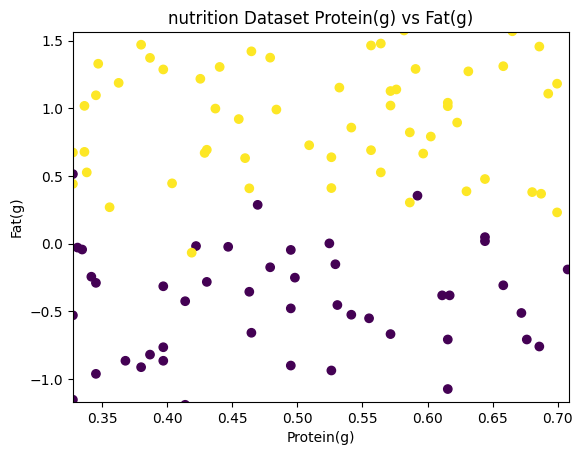

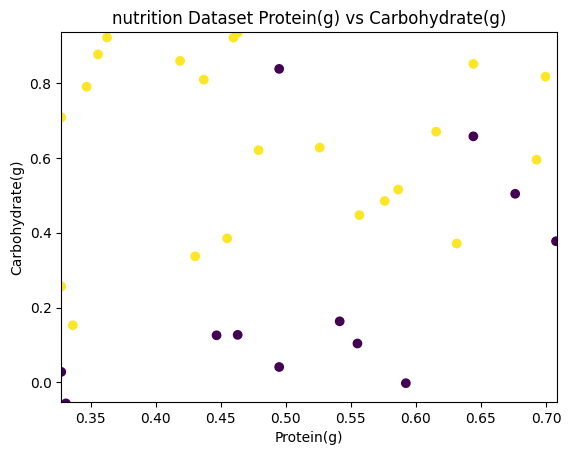

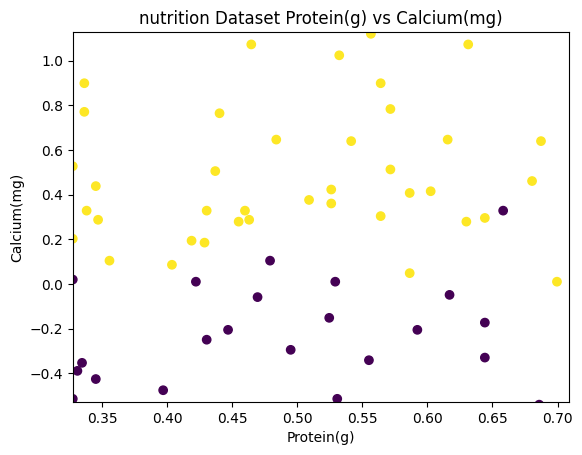

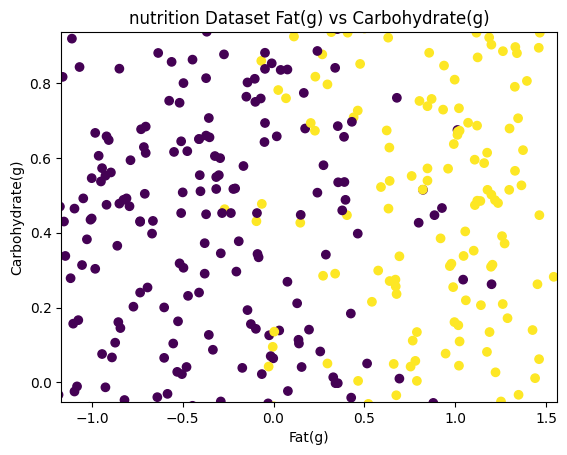

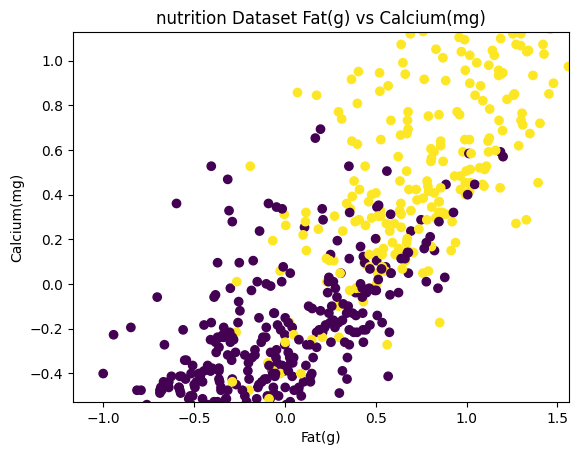

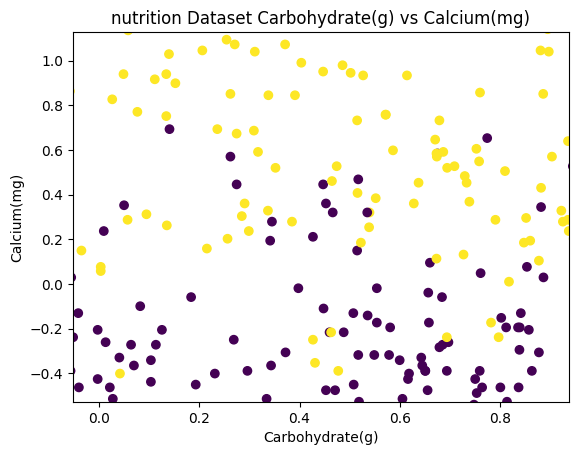

3개의 centroid 결과 분석
[0 0 0 ... 0 2 1]
[[-0.22047509 -0.22037094  0.72348527 -0.32723988]
 [ 1.06823851  1.18627362  0.11858961  1.23609871]
 [-0.65990647 -0.75754599 -0.82909337 -0.69072337]]
0.2904895480848945


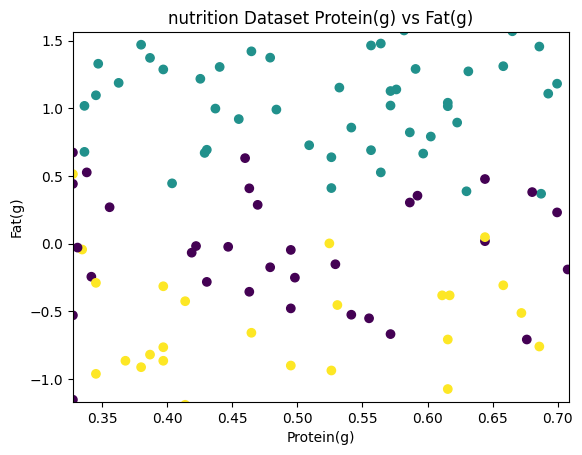

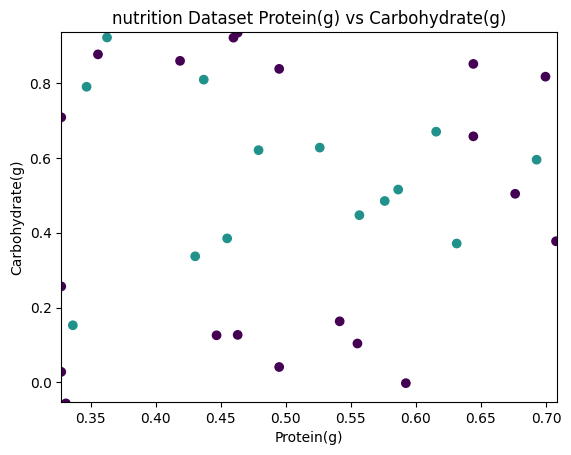

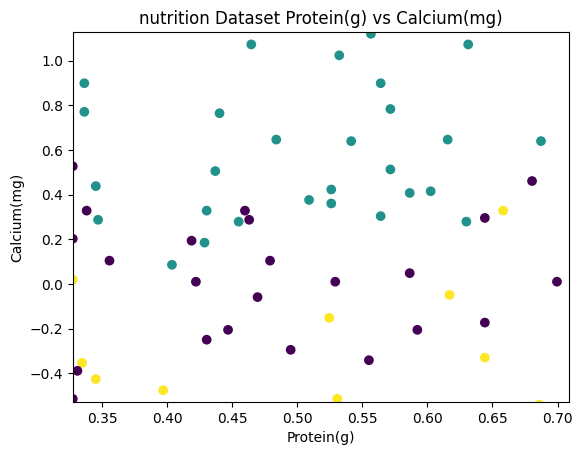

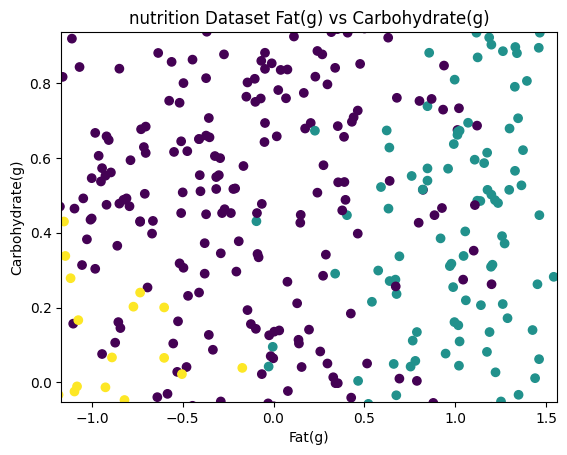

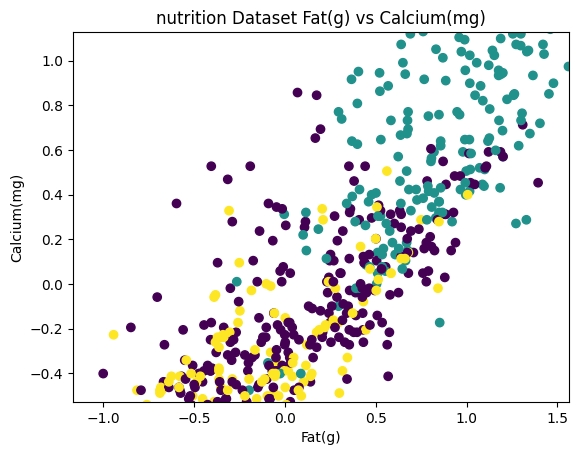

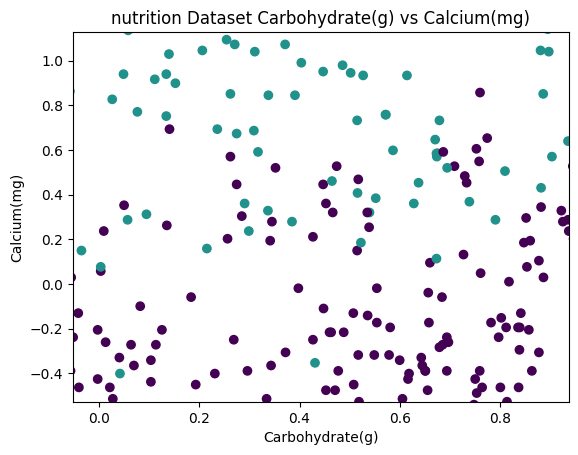

4개의 centroid 결과 분석
[0 0 0 ... 0 2 3]
[[-0.39549488 -0.25300649  0.83751213 -0.3503144 ]
 [ 0.80426604  0.27421294 -0.57046623  0.11916843]
 [-0.83977527 -0.89102426 -0.82272727 -0.77292432]
 [ 1.03939941  1.43741038  0.51073793  1.57108941]]
0.28858872916026135


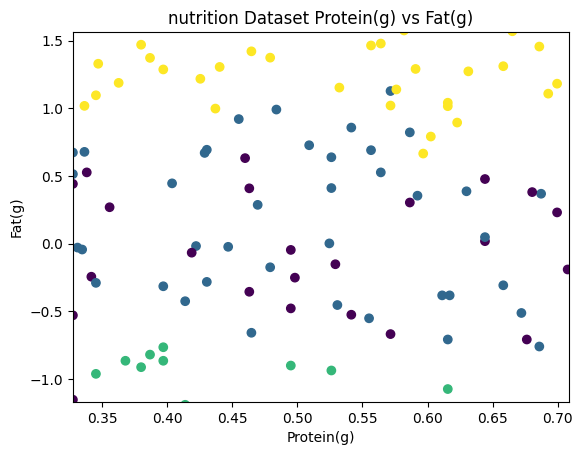

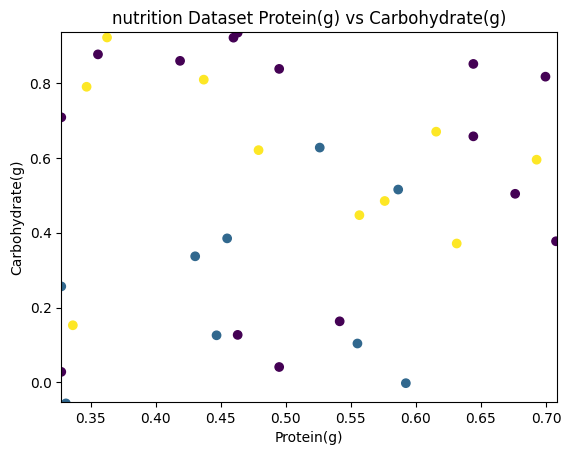

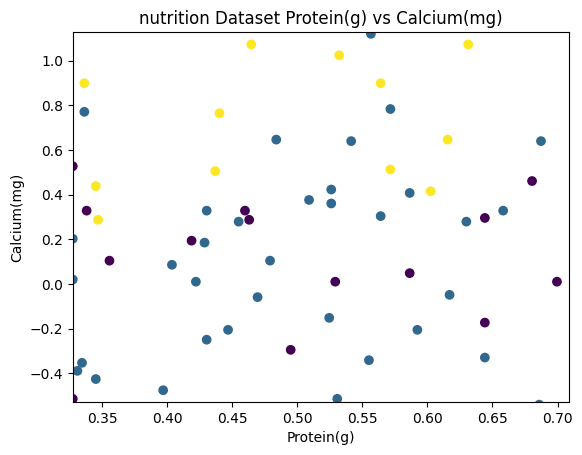

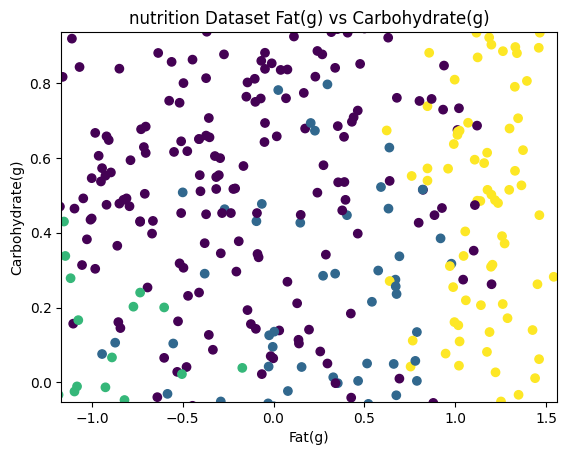

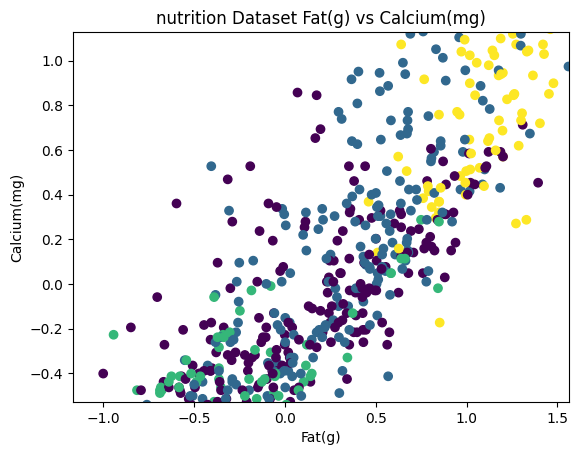

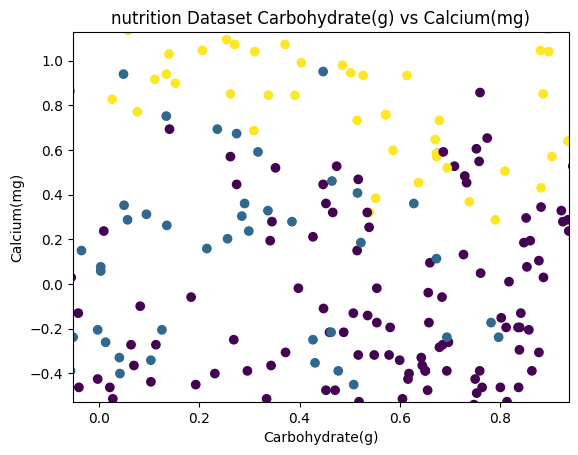

5개의 centroid 결과 분석
[3 0 3 ... 0 2 4]
[[-0.52504286 -0.67456673  0.84498474 -0.63845537]
 [ 0.65476413  0.05457165 -0.56293355 -0.1032311 ]
 [-0.91612585 -0.88476288 -0.89295862 -0.77144649]
 [ 0.14779408  0.75224169  0.88112913  0.51571081]
 [ 1.29455701  1.57552129  0.09765936  1.83897857]]
0.27752311091907106


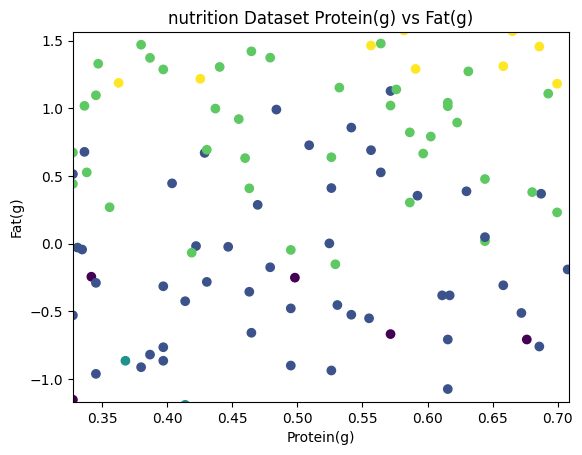

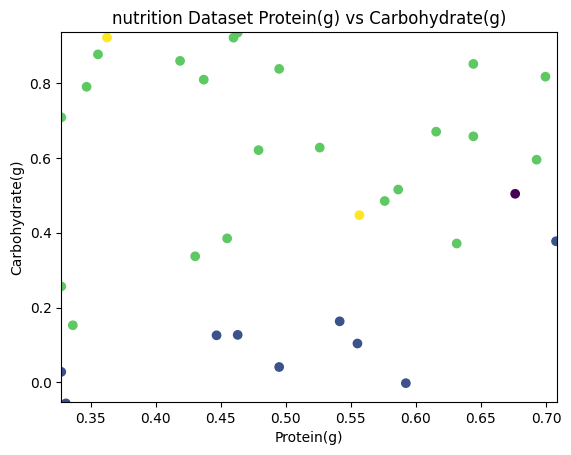

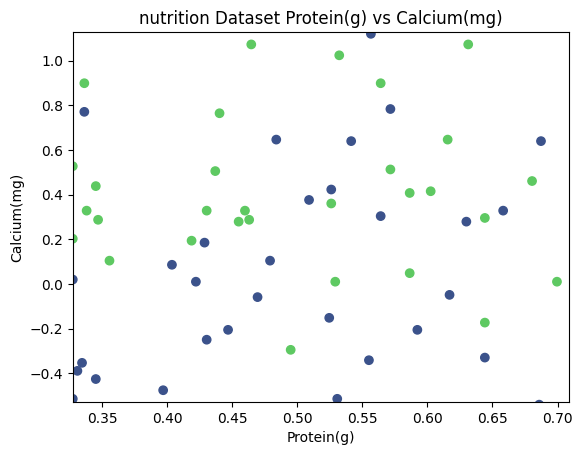

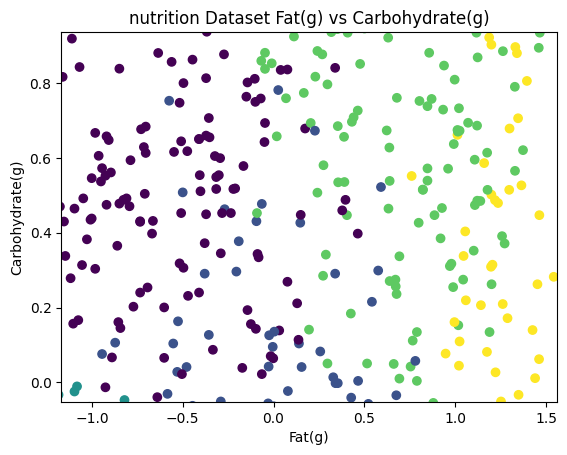

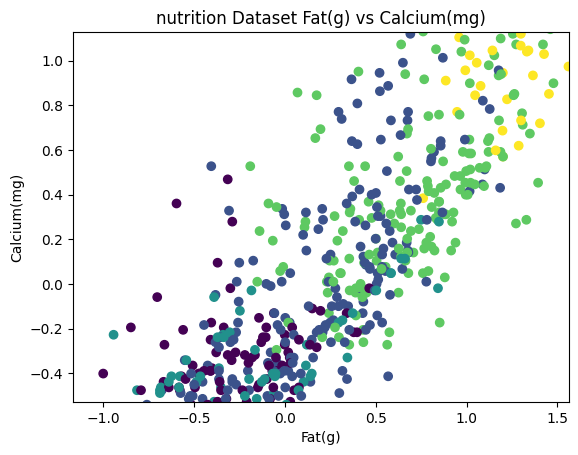

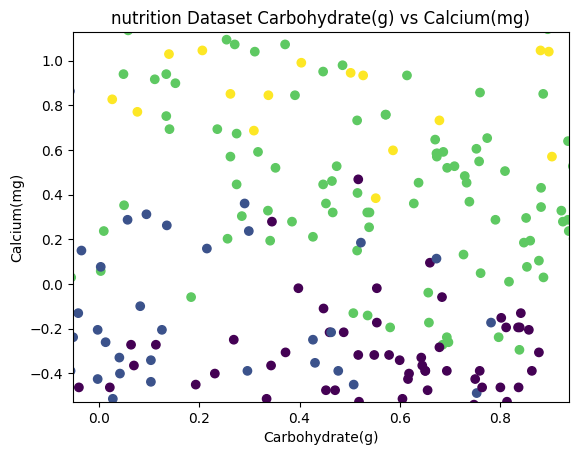

6개의 centroid 결과 분석
[3 0 3 ... 0 5 1]
[[-0.53905929 -0.70114997  0.86885344 -0.64964396]
 [ 1.41234752  1.1183567  -0.78377115  1.14659894]
 [ 0.26130365 -0.18987555 -0.53190517 -0.34537527]
 [ 0.18615302  0.69792326  0.79312639  0.43229566]
 [ 0.98120536  1.7538646   1.00706212  2.15311133]
 [-1.04983856 -1.00564374 -0.91986569 -0.83194931]]
0.2836309612024642


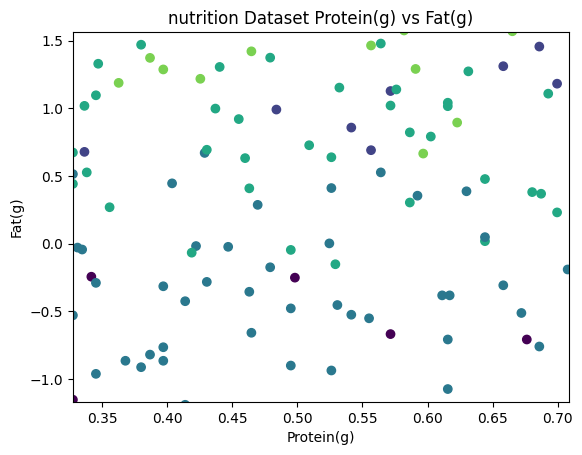

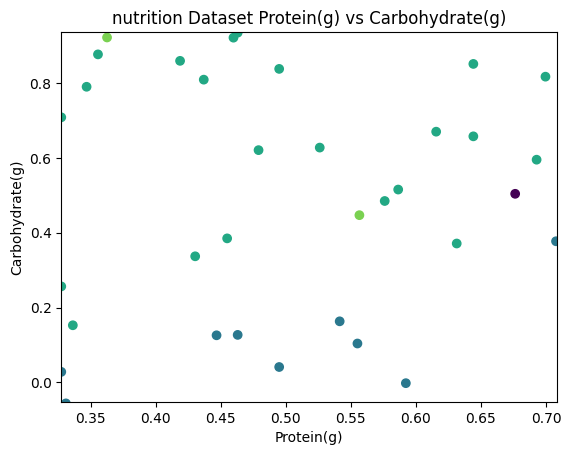

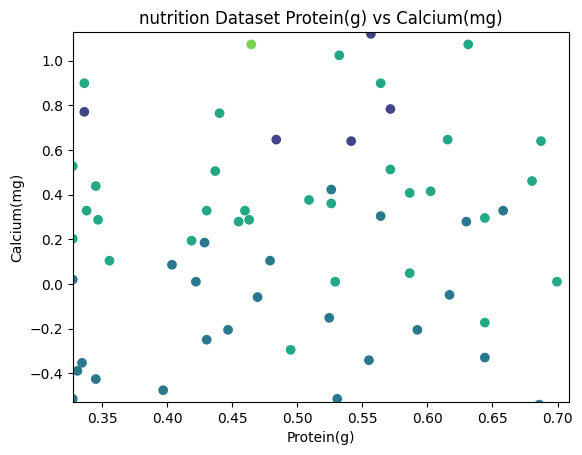

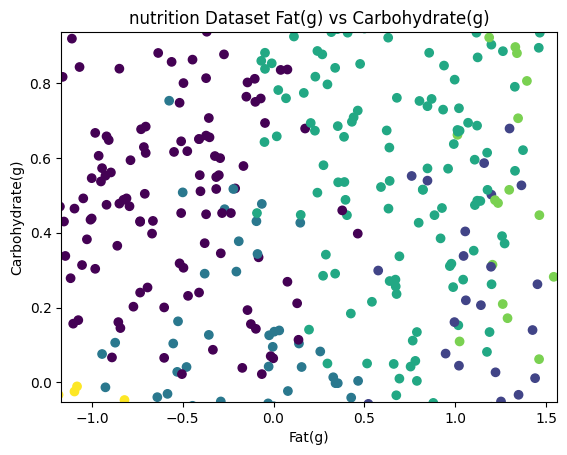

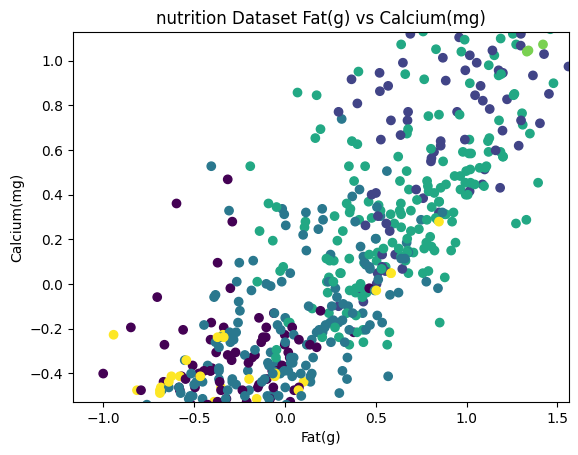

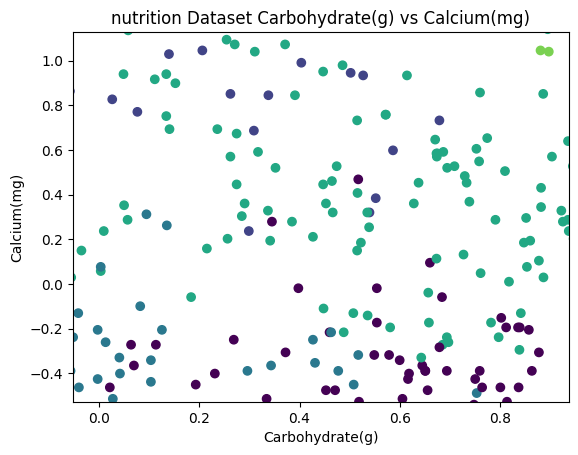

7개의 centroid 결과 분석
[6 0 6 ... 0 5 3]
[[-0.5024042  -0.73720182  0.9303111  -0.6604827 ]
 [-0.66265789  0.34068398 -0.17074266 -0.01647897]
 [ 0.54581322 -0.41461835 -0.57621819 -0.46503569]
 [ 1.4207288   1.11544438 -0.832617    1.15594793]
 [ 0.97968792  1.78029033  1.00605092  2.18609385]
 [-1.04024303 -1.05808458 -0.94208962 -0.85720172]
 [ 0.4918839   0.72028147  0.87392835  0.47516217]]
0.28972022361404565


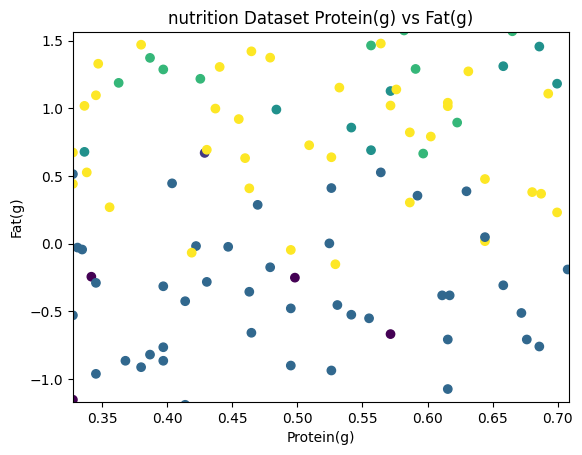

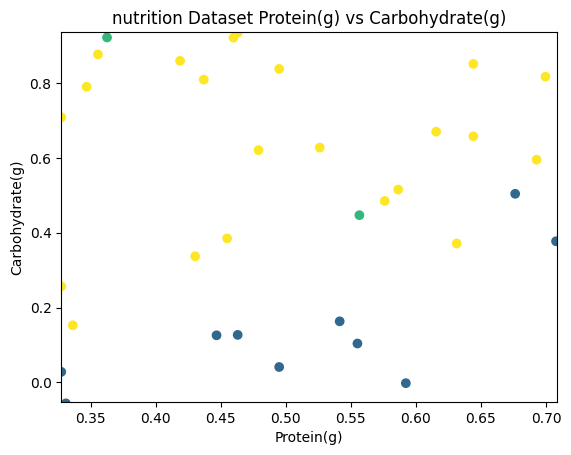

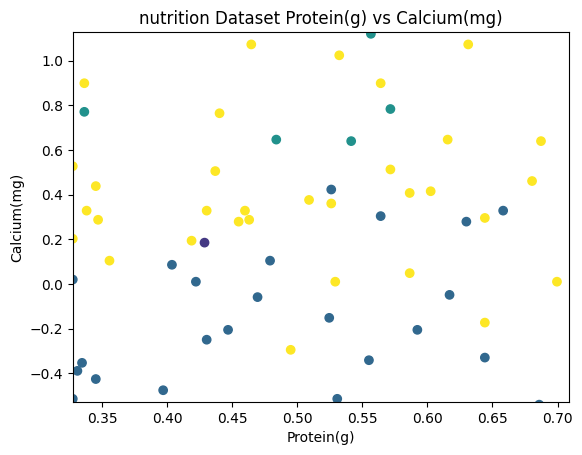

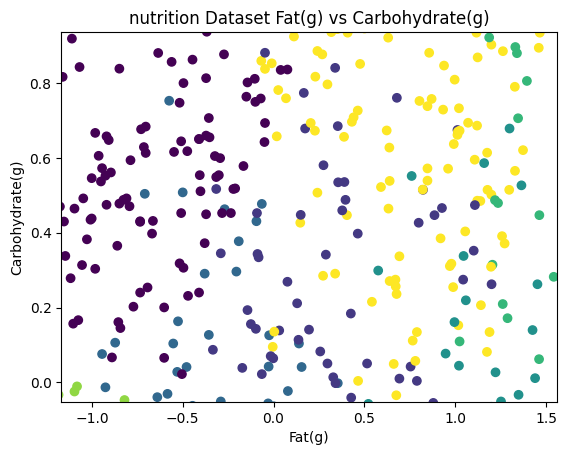

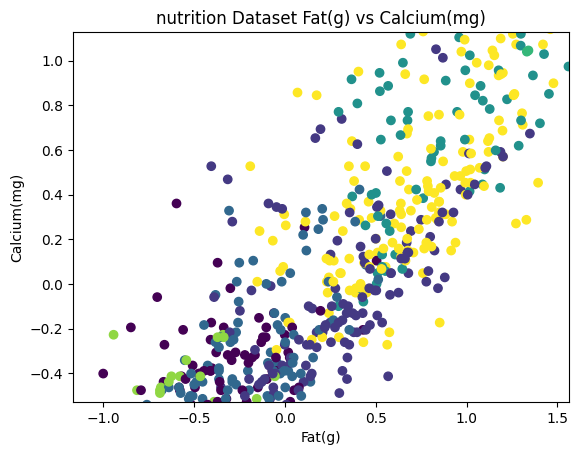

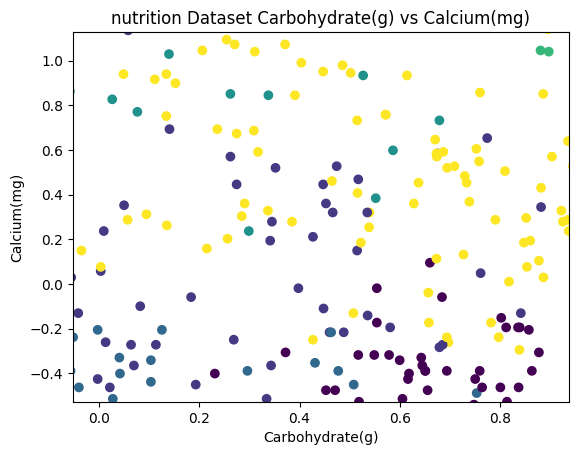

8개의 centroid 결과 분석
[0 5 0 ... 5 2 7]
[[-0.06505324  0.30824864  1.13201419  0.06545325]
 [-0.69744809  0.35109456 -0.26249892 -0.03221638]
 [-1.04277802 -1.06730264 -0.9660611  -0.86613363]
 [ 1.47657626  1.33548343 -1.03457967  1.52408866]
 [ 0.83852723  1.68982374  1.14667506  2.03229969]
 [-0.59008202 -0.87993198  0.80753641 -0.73382309]
 [ 0.56930793 -0.40089179 -0.67085077 -0.46624465]
 [ 1.06585075  0.79029317  0.32144478  0.58951174]]
0.27863781218186107


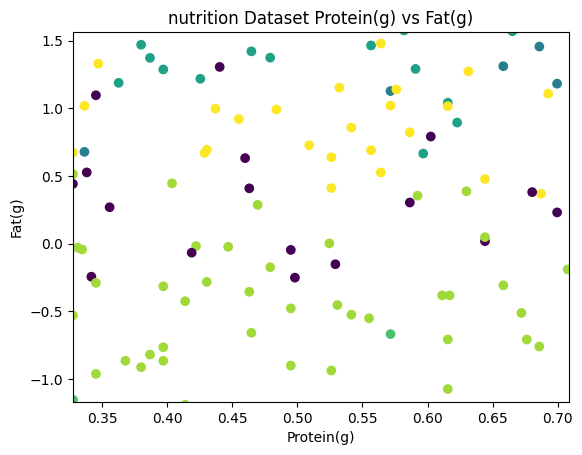

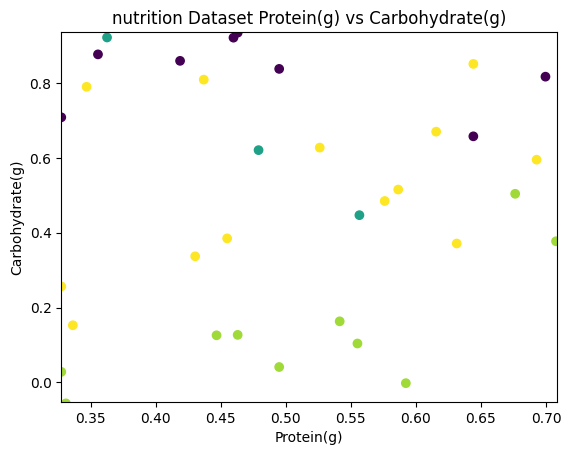

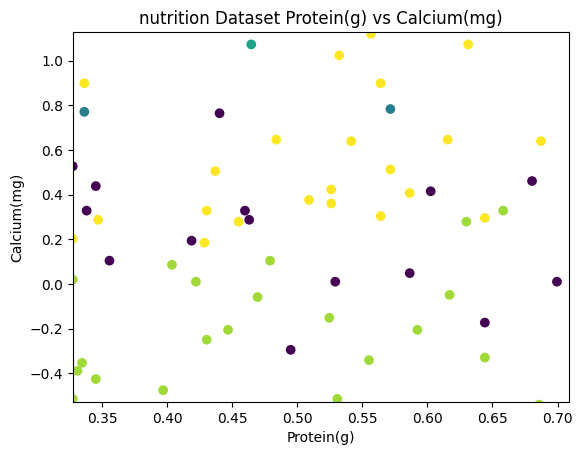

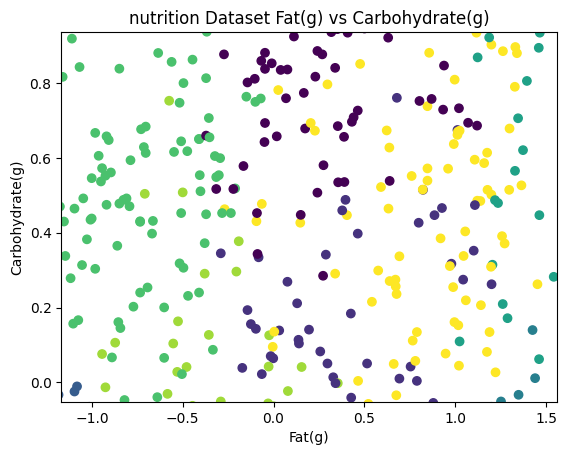

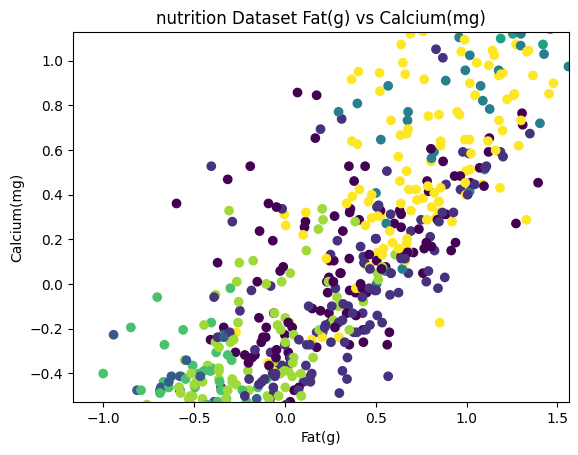

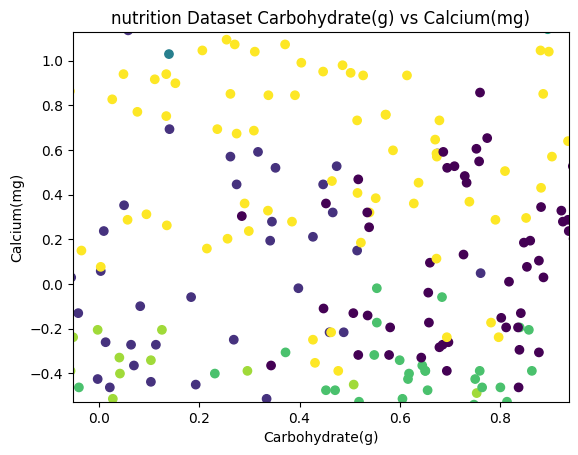

9개의 centroid 결과 분석
[8 0 8 ... 5 5 7]
[[-0.37521098 -0.74595382  1.01641249 -0.66413359]
 [-0.46924302  0.31563155 -0.42925999 -0.02087959]
 [-0.88396574 -1.13423415 -1.32115568 -0.87167855]
 [ 1.33729704  1.48291017 -1.02900066  1.77593245]
 [ 0.83134748  1.65339932  1.12885306  1.9656716 ]
 [-1.17109529 -0.88476938 -0.17761734 -0.80599848]
 [ 0.60471933 -0.45357343 -0.64997855 -0.49777473]
 [ 1.43654317  0.74352295  0.11362414  0.53389905]
 [-0.05229491  0.56950024  0.96403725  0.3034397 ]]
0.2515003502015975


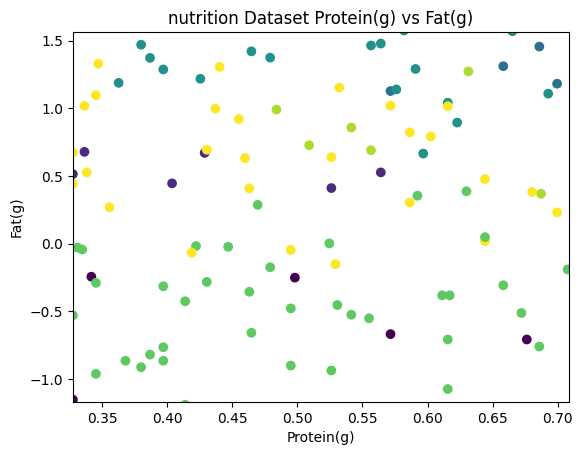

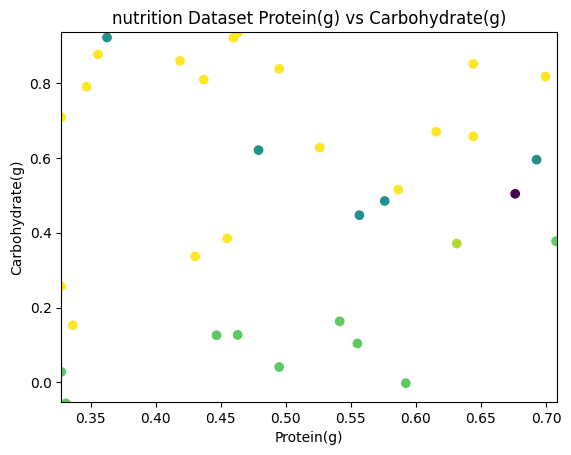

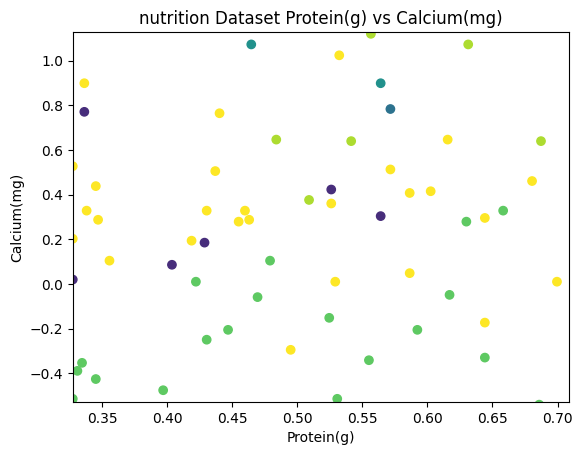

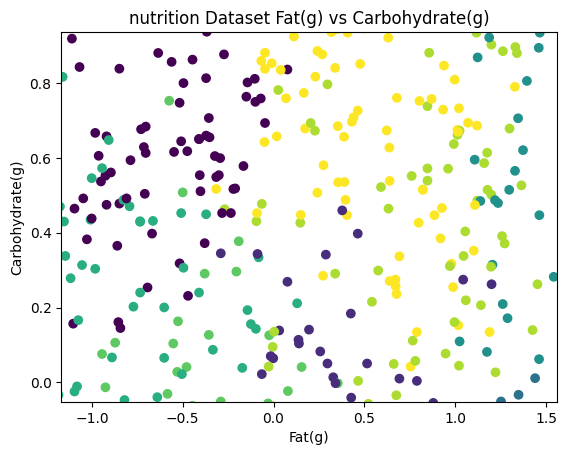

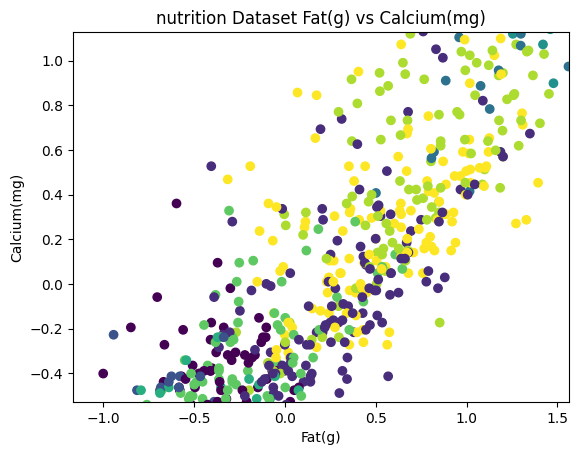

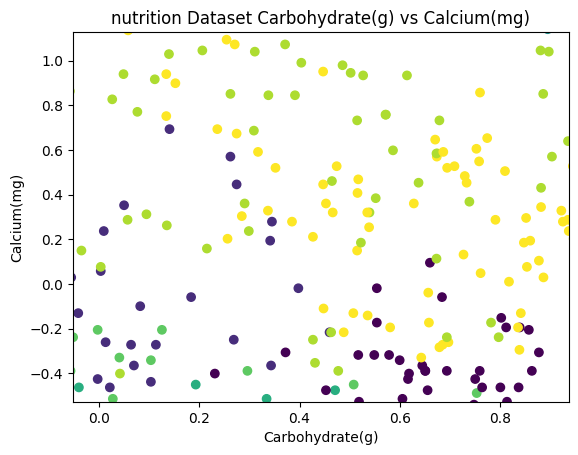

10개의 centroid 결과 분석
[8 9 0 ... 9 5 7]
[[-0.2089576   0.01384558  1.07414302 -0.18339548]
 [-0.63104249  0.3412301  -0.30537675 -0.04894891]
 [-0.8603384  -1.13102092 -1.34985626 -0.86729703]
 [ 1.36489296  1.44640885 -1.07876082  1.70343706]
 [ 0.91682821  1.76265001  1.14852214  2.1546083 ]
 [-1.21036704 -0.91568078 -0.29753493 -0.82794093]
 [ 0.54670748 -0.41197194 -0.66029727 -0.4679101 ]
 [ 1.47042814  0.70732908  0.06048679  0.50767064]
 [ 0.28344027  0.93797167  0.79177926  0.7406733 ]
 [-0.51912086 -1.02088394  0.94868458 -0.79181023]]
0.23359811033722475


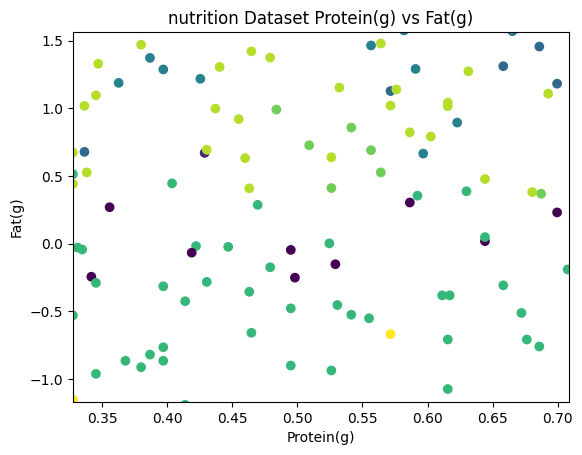

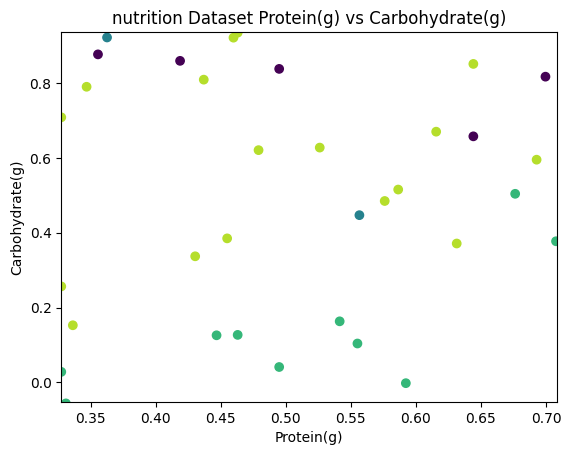

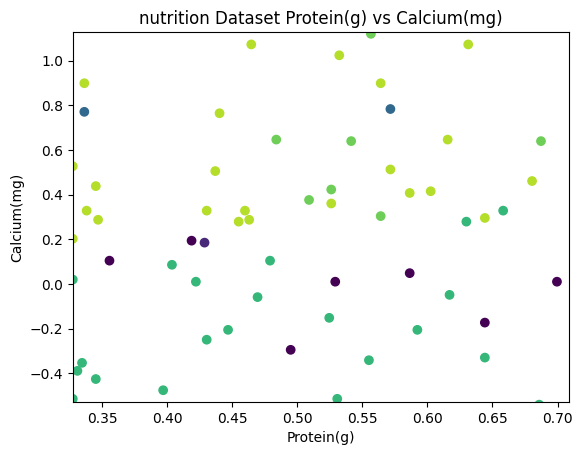

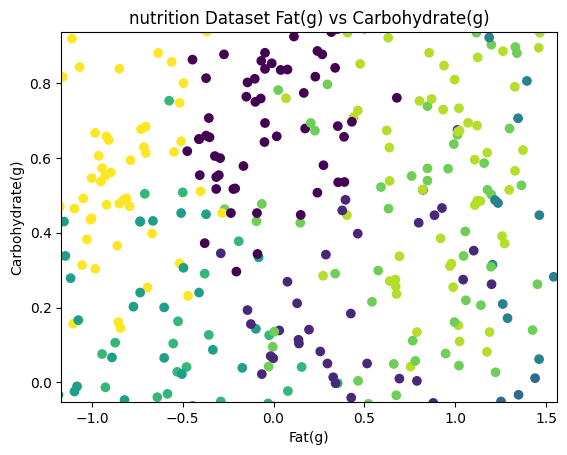

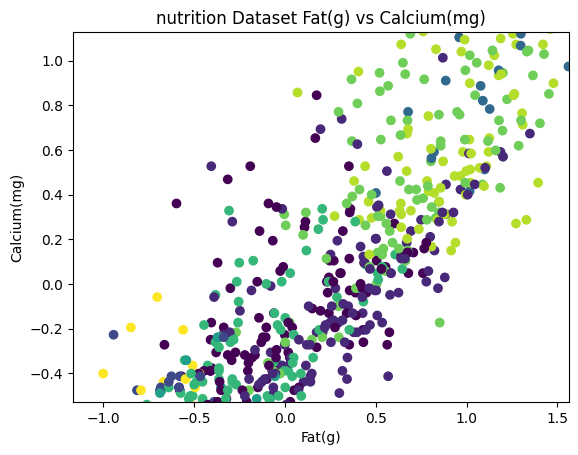

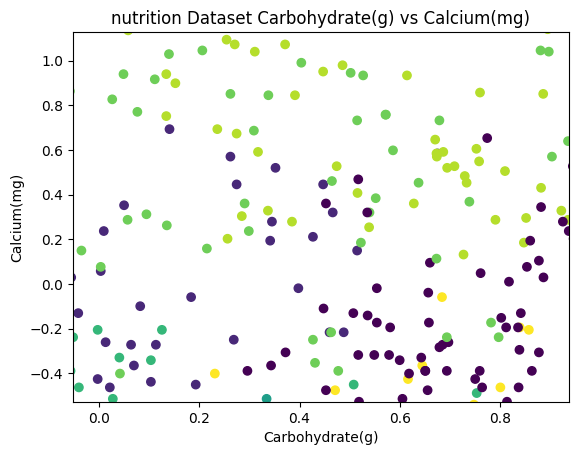

11개의 centroid 결과 분석
[8 9 8 ... 9 5 4]
[[-0.28224244 -0.11234682  0.96839927 -0.28828415]
 [-0.67149141  0.38239987 -0.26818234 -0.00308423]
 [-0.87963049 -1.12731918 -1.35708494 -0.8622028 ]
 [ 1.49827819  1.54875957 -1.19442614  1.87370143]
 [ 1.25336185  1.22794367  0.37423962  1.15171969]
 [-1.23907023 -0.91689751 -0.29215658 -0.82761152]
 [ 0.39869815 -0.57853727 -0.57261237 -0.58522693]
 [ 1.15198887  0.40765329 -0.63005694  0.25605831]
 [ 0.35337347  0.75691531  1.07579362  0.47444301]
 [-0.54073973 -1.09623206  1.00907826 -0.83746875]
 [ 0.77909502  1.83663479  1.3185641   2.38081226]]
0.23733979463471738


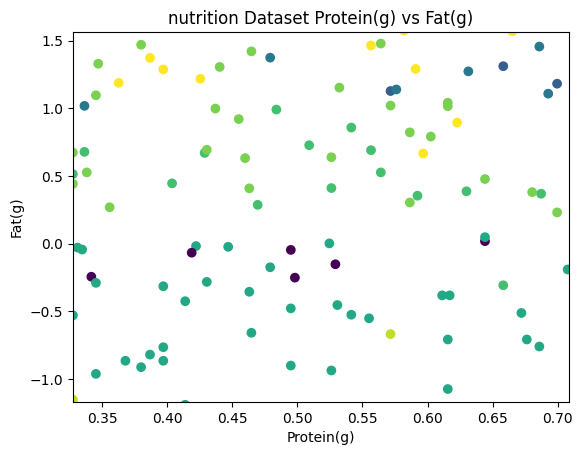

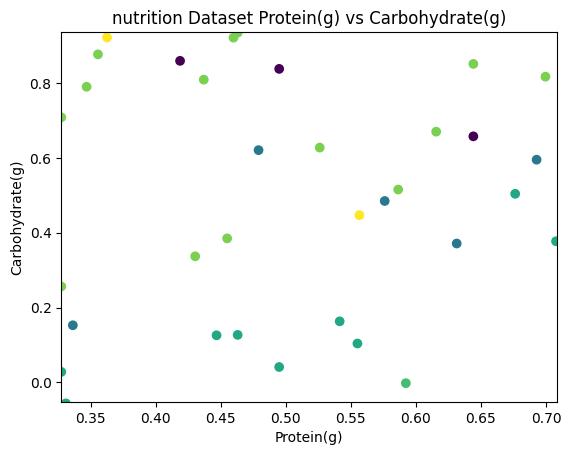

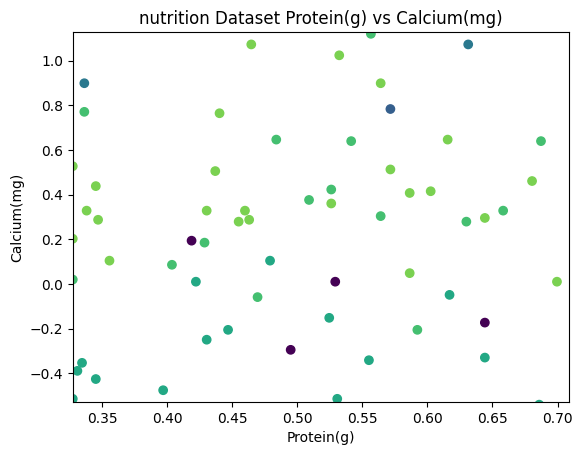

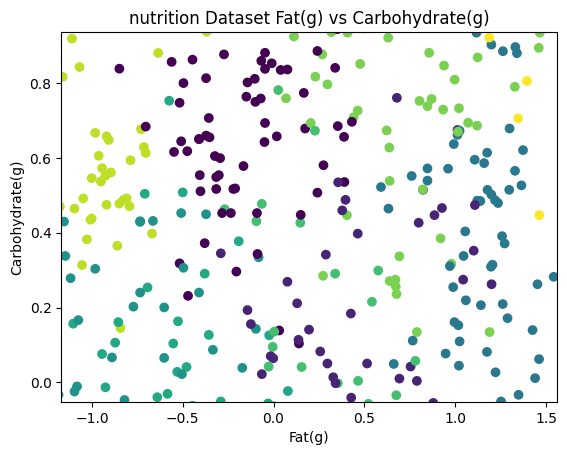

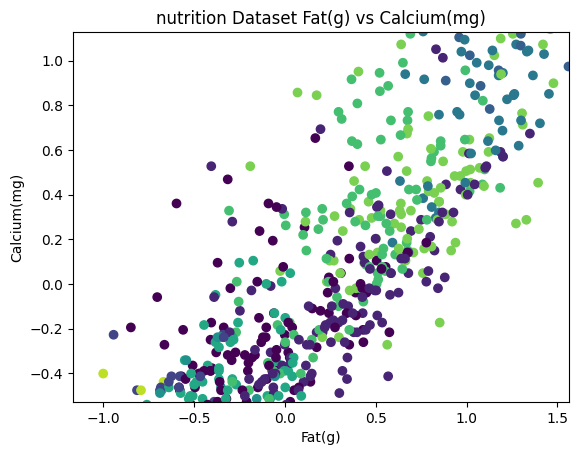

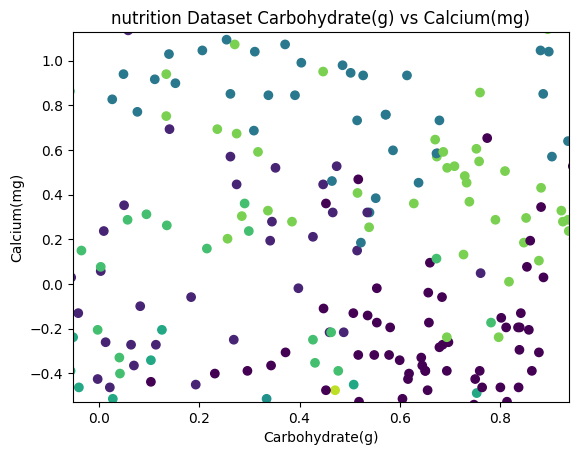

In [ ]:
# K-means 클러스터링 이용 n_cluster = 4
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

X = df1_cluster
X = np.log1p(X)
scaler = StandardScaler()
X = scaler.fit_transform(X)
print(X)

# df1_cluster의 실제 열 이름에 맞춰 column_list를 업데이트합니다.
actual_columns = ['Protein(g)', 'Fat(g)', 'Carbohydrate(g)', 'Calcium(mg)', 'Iron(mg)', 'Vitamin A(μg RAE)', 'Thiamine(mg)', 'Riboflavin(mg)', 'Vitamin C(mg)']

for k in range(2, 12):
  print(f"{k}개의 centroid 결과 분석")
  kmeans = KMeans(n_clusters=k, random_state=0, n_init="auto").fit(X)
  print(kmeans.labels_)
  print(kmeans.cluster_centers_)

  # 'Protein(g)', 'Fat(g)', 'Carbohydrate(g)', 'Calcium(mg)', 'Iron(mg)', 'Vitamin A(μg RAE)', 'Thiamine(mg)', 'Riboflavin(mg)', 'Vitamin C(mg)' 클러스터링 시각화
  target = kmeans.fit_predict(X)
  print(silhouette_score(X, target))

  # 업데이트된 actual_columns 리스트를 사용하여 시각화합니다.
  for i in range(4):
    for j in range(i + 1, 4):
      plt.scatter(X[:, i], X[:, j], c=target)
      plt.xlabel(actual_columns[i])
      plt.xlim([min(X[i]), max(X[i])]) # X의 실제 범위에 맞춰 xlim 설정
      plt.ylim([min(X[j]), max(X[j])]) # X의 실제 범위에 맞춰 ylim 설정
      plt.ylabel(actual_columns[j])
      plt.title(f'nutrition Dataset {actual_columns[i]} vs {actual_columns[j]}')
      plt.show()

In [ ]:
print(X.shape)

(1078, 4)


[[ 0.32749207  0.44106241  0.70865394  0.52741907]
 [-0.42755468 -1.1688089   1.56243672 -0.95371877]
 [-0.05168598  0.31825671  0.93640239  0.23686824]
 ...
 [-1.21523762 -0.94413575  0.57273914 -0.84127877]
 [-1.45434605 -1.32071858 -0.42164298 -0.97037397]
 [ 2.50223761  1.15974453  0.58622207  0.59847682]]
2개의 centroid 결과 분석
Silhouette Score: 0.3916
PCA 설명력: 0.86


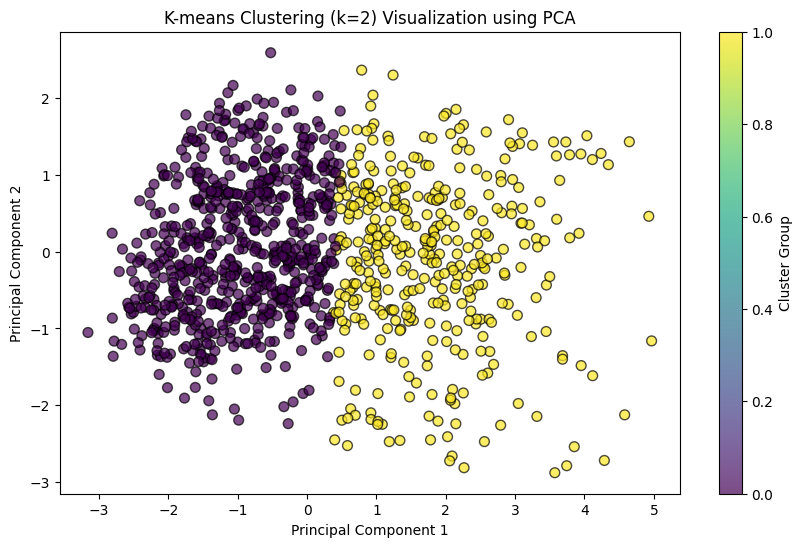

--------------------------------------------------
3개의 centroid 결과 분석
Silhouette Score: 0.2905
PCA 설명력: 0.86


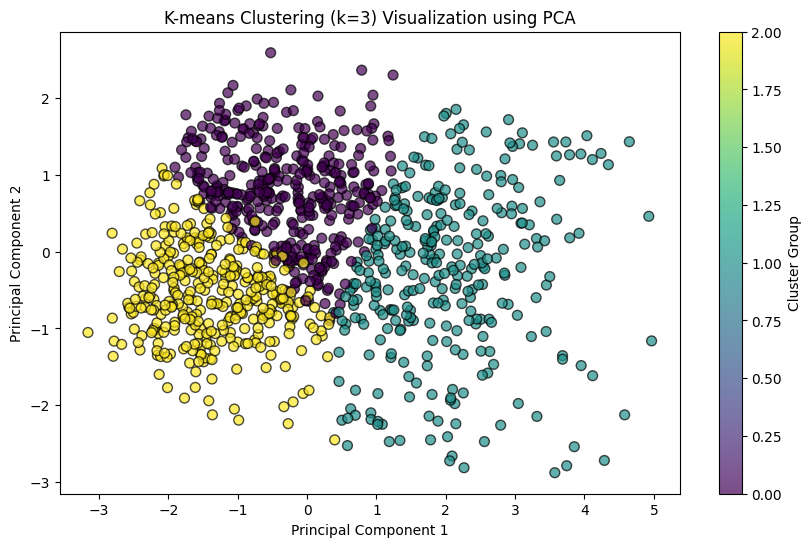

--------------------------------------------------
4개의 centroid 결과 분석
Silhouette Score: 0.2886
PCA 설명력: 0.86


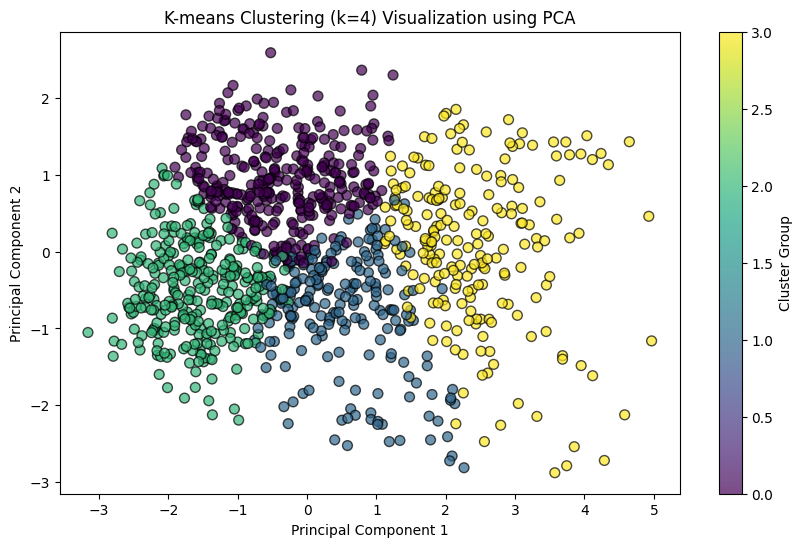

--------------------------------------------------
5개의 centroid 결과 분석
Silhouette Score: 0.2775
PCA 설명력: 0.86


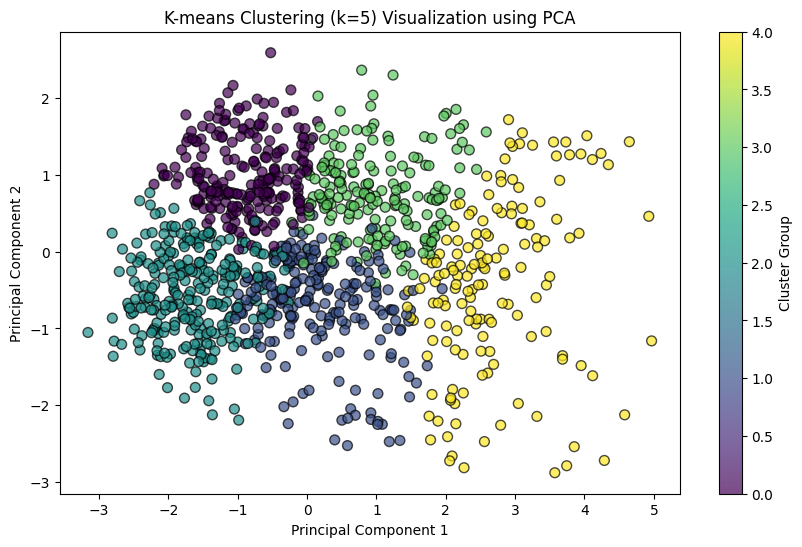

--------------------------------------------------
6개의 centroid 결과 분석
Silhouette Score: 0.2836
PCA 설명력: 0.86


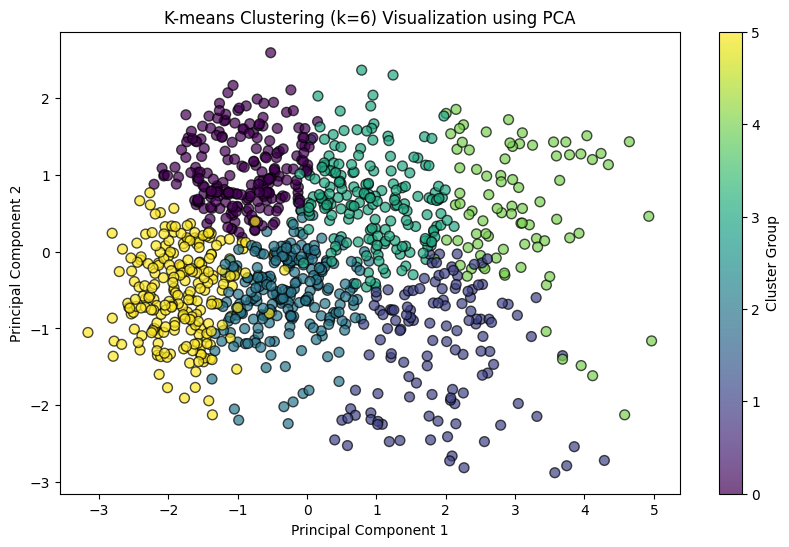

--------------------------------------------------
7개의 centroid 결과 분석
Silhouette Score: 0.2897
PCA 설명력: 0.86


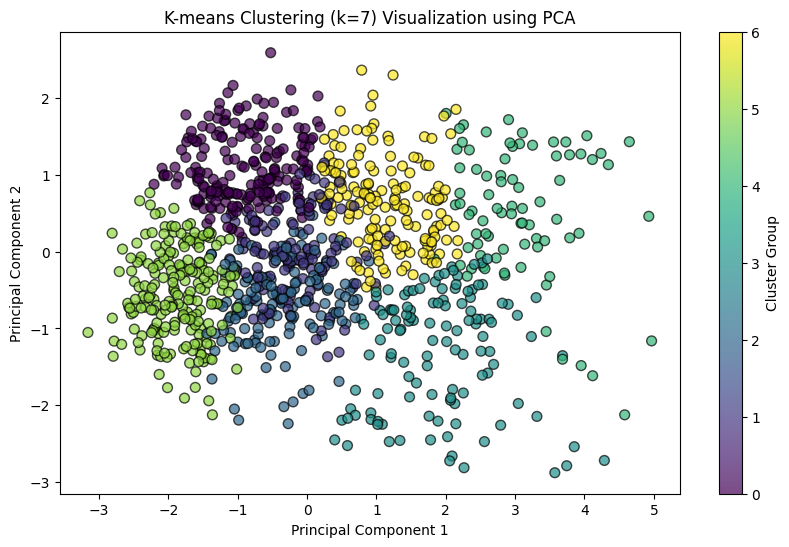

--------------------------------------------------
8개의 centroid 결과 분석
Silhouette Score: 0.2786
PCA 설명력: 0.86


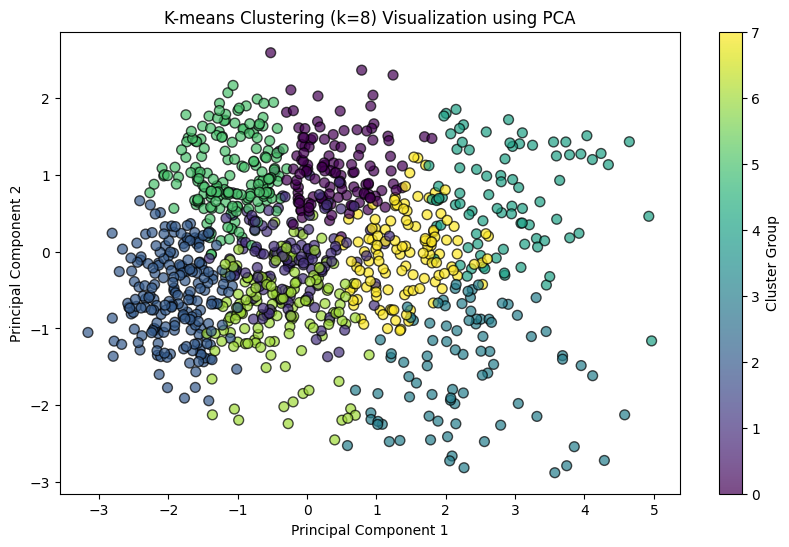

--------------------------------------------------
9개의 centroid 결과 분석
Silhouette Score: 0.2515
PCA 설명력: 0.86


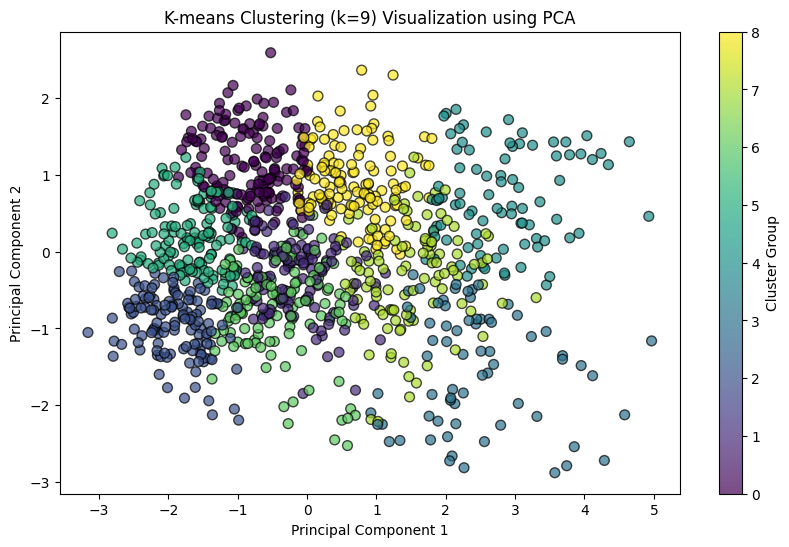

--------------------------------------------------
10개의 centroid 결과 분석
Silhouette Score: 0.2336
PCA 설명력: 0.86


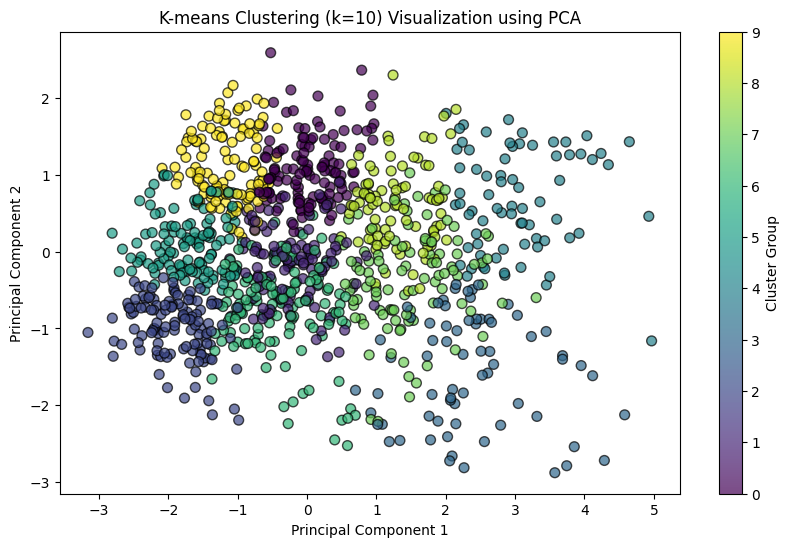

--------------------------------------------------
11개의 centroid 결과 분석
Silhouette Score: 0.2373
PCA 설명력: 0.86


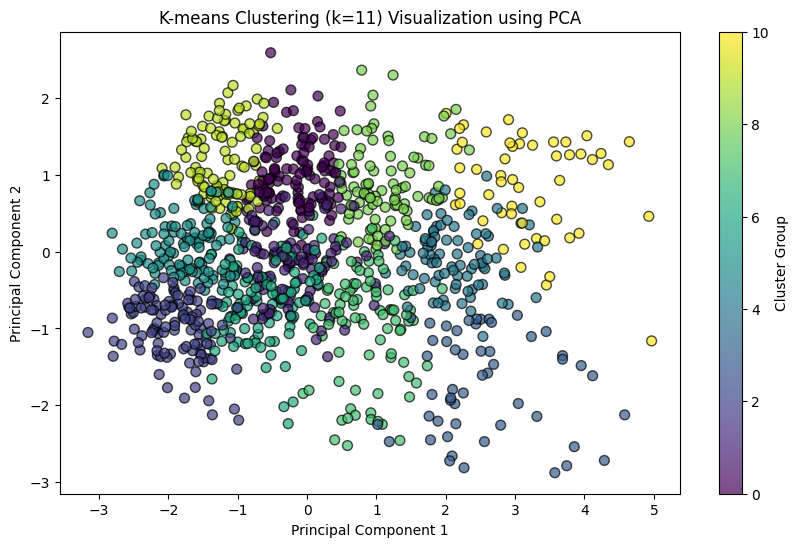

--------------------------------------------------


In [ ]:
# K-means 클러스터링 이용 n_cluster = 4
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA

X = df1_cluster
X = np.log1p(X)
scaler = StandardScaler()
X = scaler.fit_transform(X)
print(X)
for k in range(2, 12):
  print(f"{k}개의 centroid 결과 분석")
  # 1. K-means 학습
  kmeans = KMeans(n_clusters=k, random_state=0, n_init="auto").fit(X)
  target = kmeans.fit_predict(X)

  # 실루엣 점수 출력
  score = silhouette_score(X, target)
  print(f"Silhouette Score: {score:.4f}")

  # -------------------------------------------------------
  # 2. PCA로 차원 축소 (9개 변수 -> 2개 변수)
  pca = PCA(n_components=2)
  pca_transformed = pca.fit_transform(X)

  # 설명력 확인 (선택사항: 2개의 주성분이 전체 데이터의 분산을 얼마나 설명하는지)
  print(f"PCA 설명력: {sum(pca.explained_variance_ratio_):.2f}")

  # 3. PCA 시각화 (산점도)
  plt.figure(figsize=(10, 6))

  # x축: 첫 번째 주성분, y축: 두 번째 주성분, 색상(c): 클러스터 라벨
  plt.scatter(pca_transformed[:, 0], pca_transformed[:, 1],
              c=target, cmap='viridis', edgecolor='k', s=50, alpha=0.7)

  plt.xlabel('Principal Component 1')
  plt.ylabel('Principal Component 2')
  plt.title(f'K-means Clustering (k={k}) Visualization using PCA')
  plt.colorbar(label='Cluster Group')
  plt.show()
  # -------------------------------------------------------
  print("-" * 50)

PCA 설명력(비율): [0.62027189 0.23990631 0.11772037]
총 설명력: 0.9779
4개의 centroid 결과 분석
Silhouette Score: 0.2941


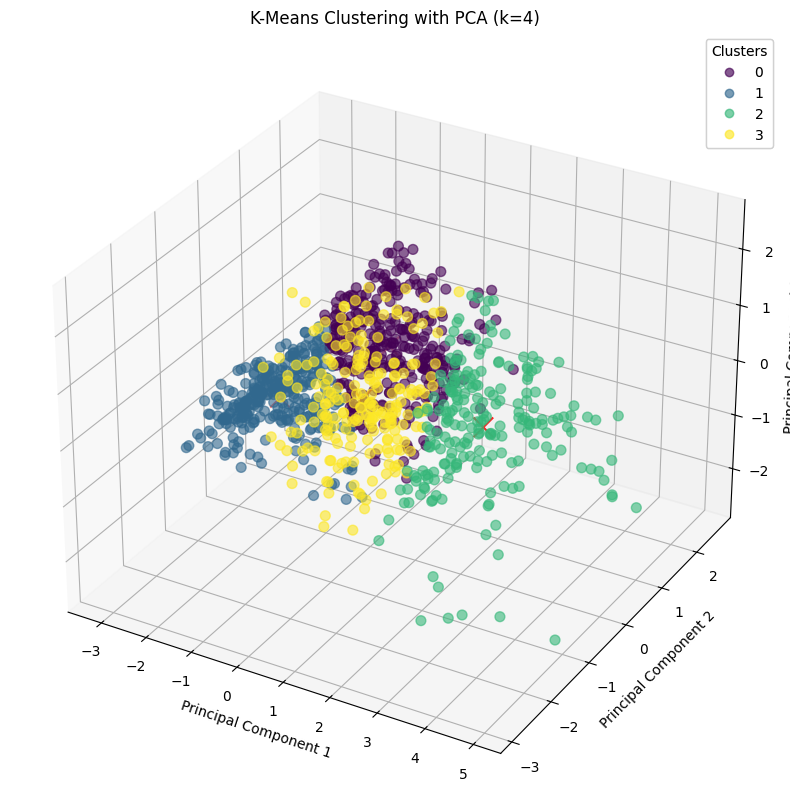

5개의 centroid 결과 분석
Silhouette Score: 0.2967


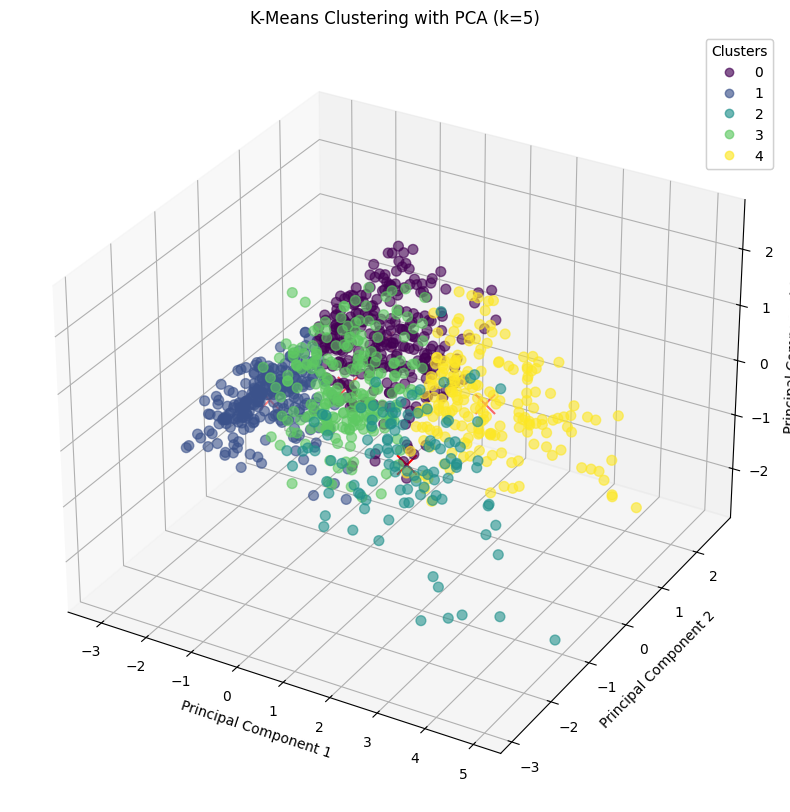

6개의 centroid 결과 분석
Silhouette Score: 0.2763


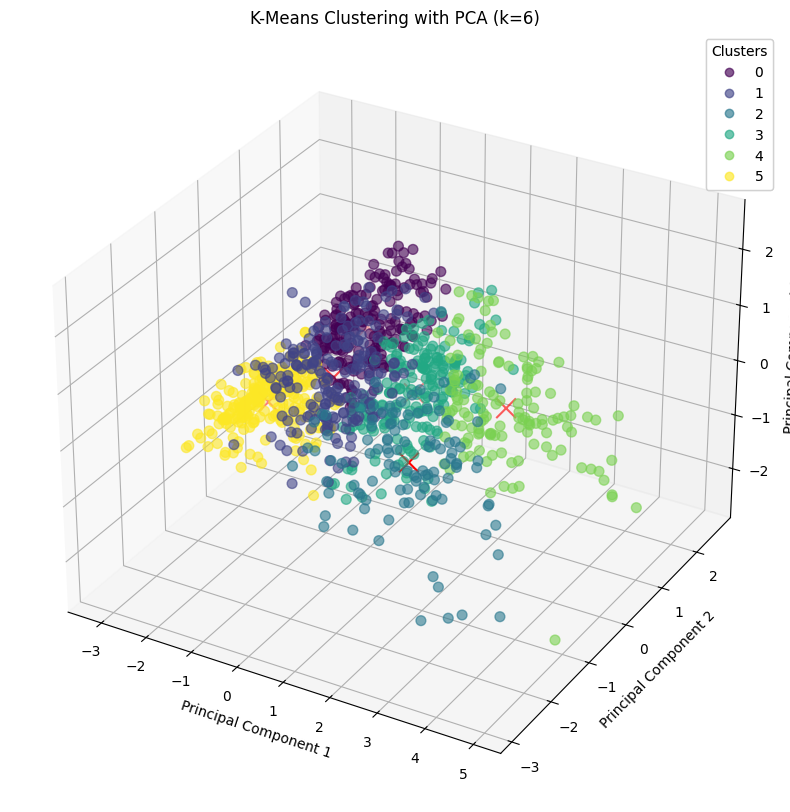

7개의 centroid 결과 분석
Silhouette Score: 0.2757


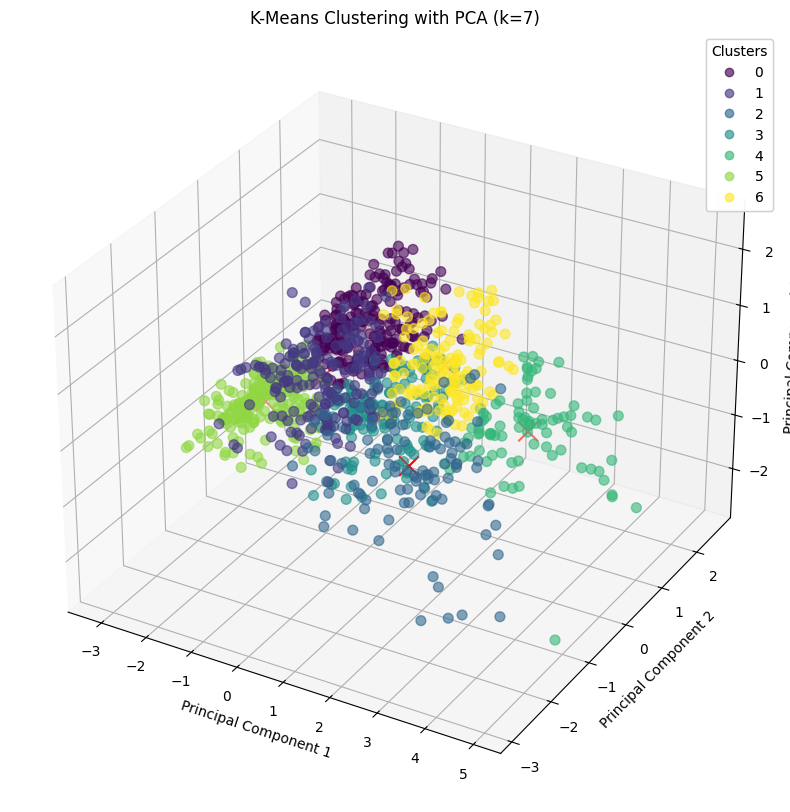

8개의 centroid 결과 분석
Silhouette Score: 0.2619


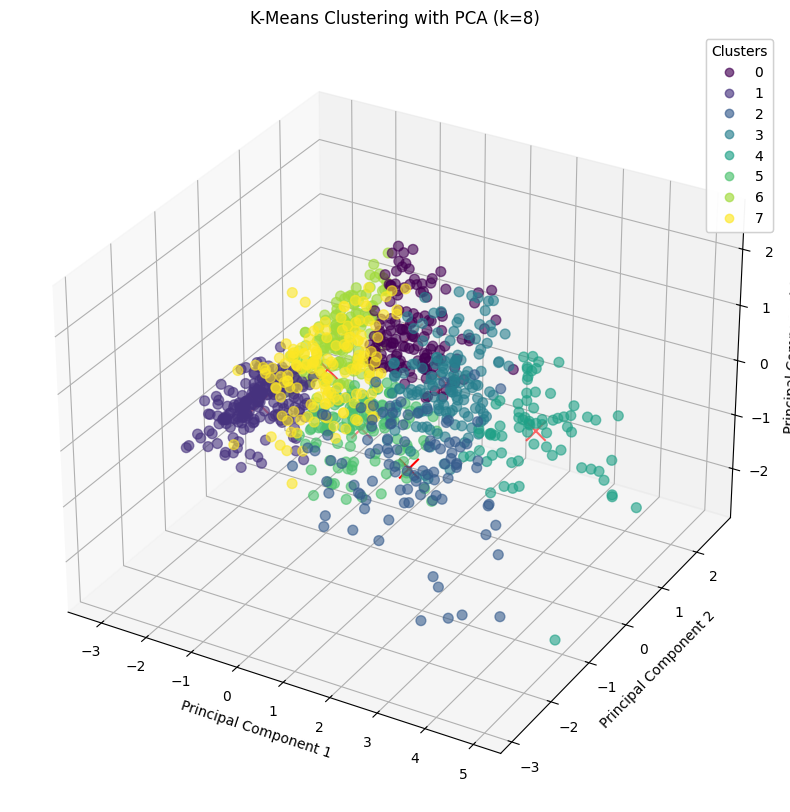

9개의 centroid 결과 분석
Silhouette Score: 0.2506


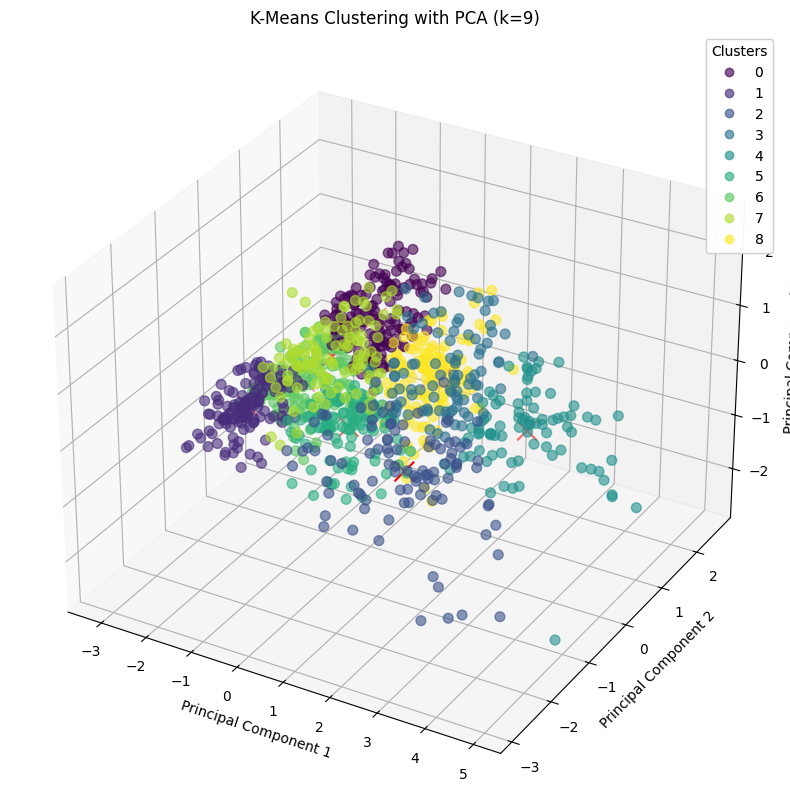

10개의 centroid 결과 분석
Silhouette Score: 0.2434


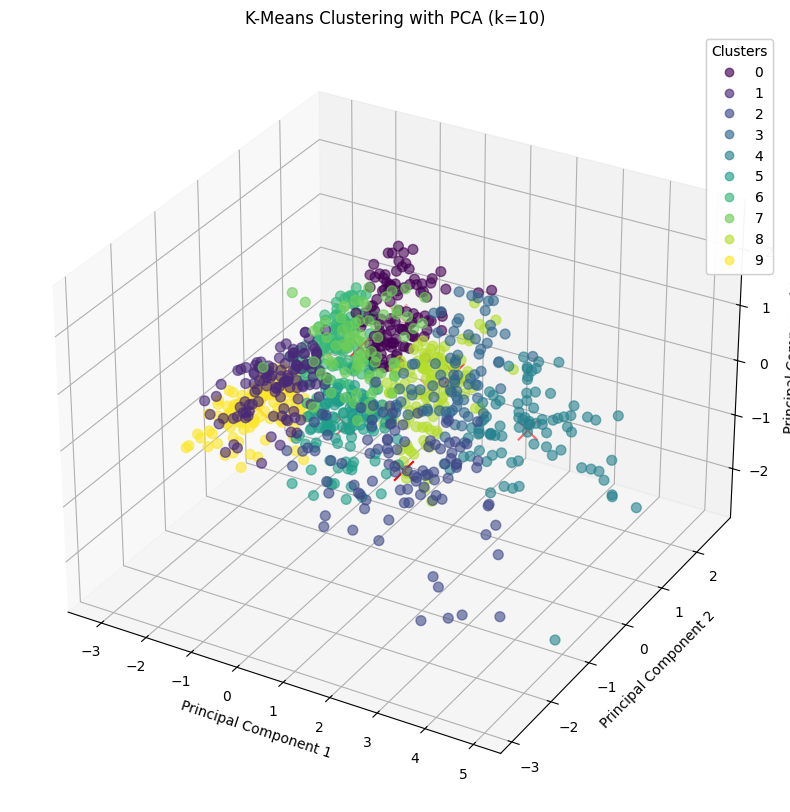

11개의 centroid 결과 분석
Silhouette Score: 0.2425


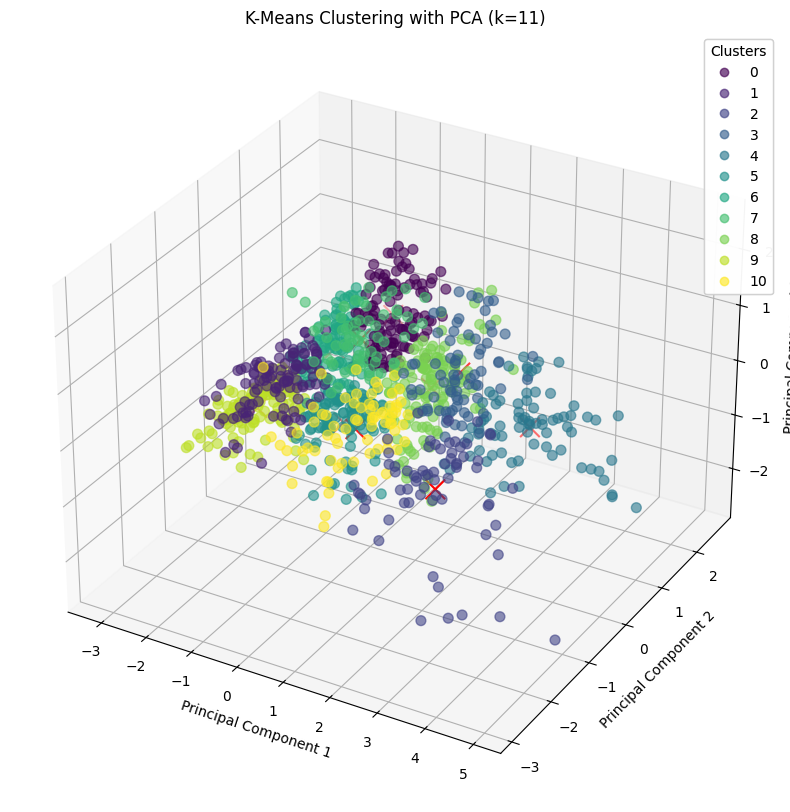

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # 3D 그래프를 위한 모듈
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# 1. 데이터 스케일링 (기존과 동일)
X = df1_cluster
X = np.log1p(X)
scaler = StandardScaler()

X_scaled = scaler.fit_transform(X)

# 2. PCA로 3차원으로 축소 (n_components=3)
pca = PCA(n_components=3)
X_pca = pca.fit_transform(X_scaled)

# (선택 사항) PCA가 데이터를 얼마나 잘 설명하는지 확인
print(f"PCA 설명력(비율): {pca.explained_variance_ratio_}")
print(f"총 설명력: {sum(pca.explained_variance_ratio_):.4f}")

for k in range(4, 12):
  print(f"{k}개의 centroid 결과 분석")
  # 3. PCA된 데이터로 K-Means 클러스터링 수행 (k=4)
  kmeans = KMeans(n_clusters=k, random_state=0, n_init="auto")
  target = kmeans.fit_predict(X_pca)  # 축소된 데이터(X_pca)로 학습 및 예측

  # 실루엣 점수 출력
  score = silhouette_score(X, target)
  print(f"Silhouette Score: {score:.4f}")
  # 4. 3차원 시각화
  fig = plt.figure(figsize=(12, 10))
  ax = fig.add_subplot(111, projection='3d')

  # 각 클러스터별로 다른 색상으로 산점도 그리기
  scatter = ax.scatter(
      X_pca[:, 0],  # PC1 (X축)
      X_pca[:, 1],  # PC2 (Y축)
      X_pca[:, 2],  # PC3 (Z축)
      c=target,     # 클러스터 라벨에 따라 색상 구분
      cmap='viridis', # 색상 맵 (viridis, rainbow, jet 등 변경 가능)
      s=50,         # 점 크기
      alpha=0.6     # 투명도
  )

  # Centroid(중심점)도 함께 시각화 (빨간색 X 표시)
  centers = kmeans.cluster_centers_
  ax.scatter(centers[:, 0], centers[:, 1], centers[:, 2],
            c='red', s=200, marker='x', label='Centroids')

  # 라벨 및 범례 설정
  ax.set_title(f'K-Means Clustering with PCA (k={k})')
  ax.set_xlabel('Principal Component 1')
  ax.set_ylabel('Principal Component 2')
  ax.set_zlabel('Principal Component 3')

  # 컬러바 추가 (어떤 색이 어떤 그룹인지 표시)
  legend1 = ax.legend(*scatter.legend_elements(), title="Clusters")
  ax.add_artist(legend1)

  plt.show()

=== 2개의 centroid 결과 분석 ===
Silhouette Score: 0.3916
PCA 설명력(누적): 0.98


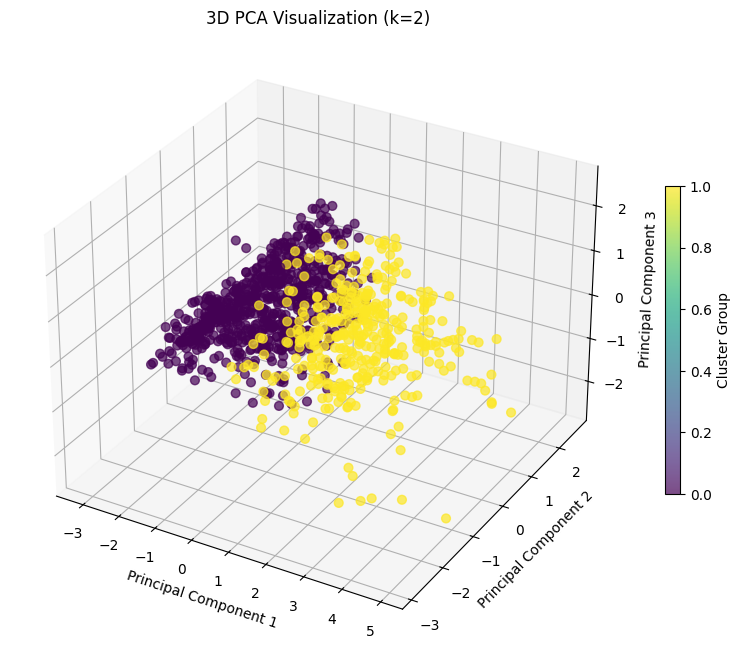



=== 3개의 centroid 결과 분석 ===
Silhouette Score: 0.2905
PCA 설명력(누적): 0.98


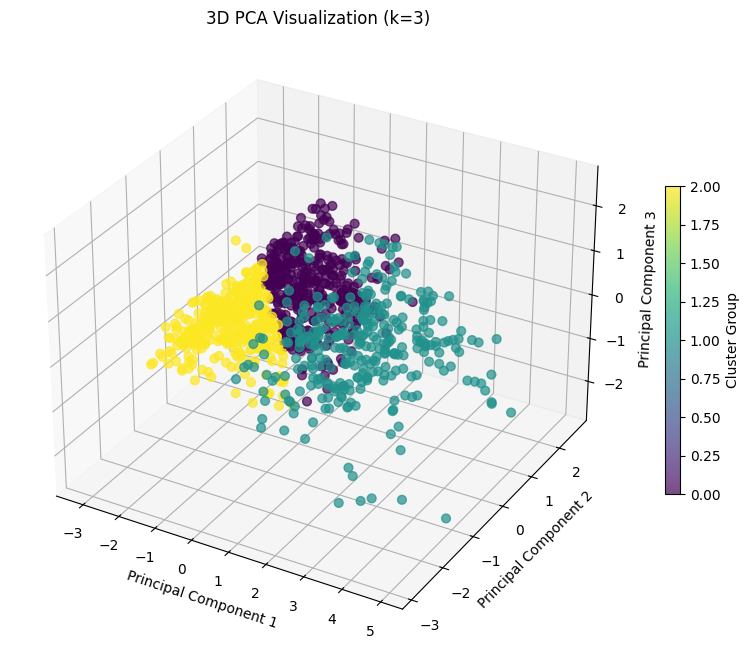



=== 4개의 centroid 결과 분석 ===
Silhouette Score: 0.2886
PCA 설명력(누적): 0.98


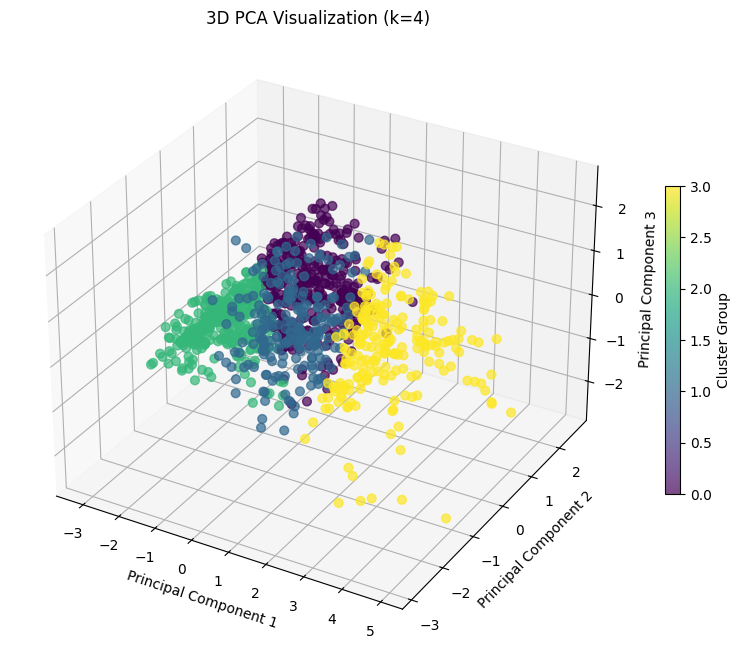



=== 5개의 centroid 결과 분석 ===
Silhouette Score: 0.2775
PCA 설명력(누적): 0.98


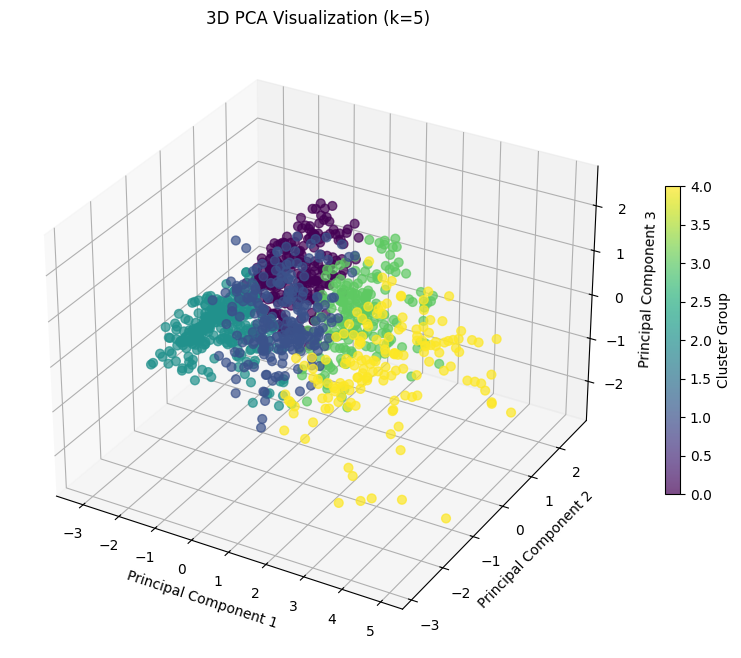



=== 6개의 centroid 결과 분석 ===
Silhouette Score: 0.2836
PCA 설명력(누적): 0.98


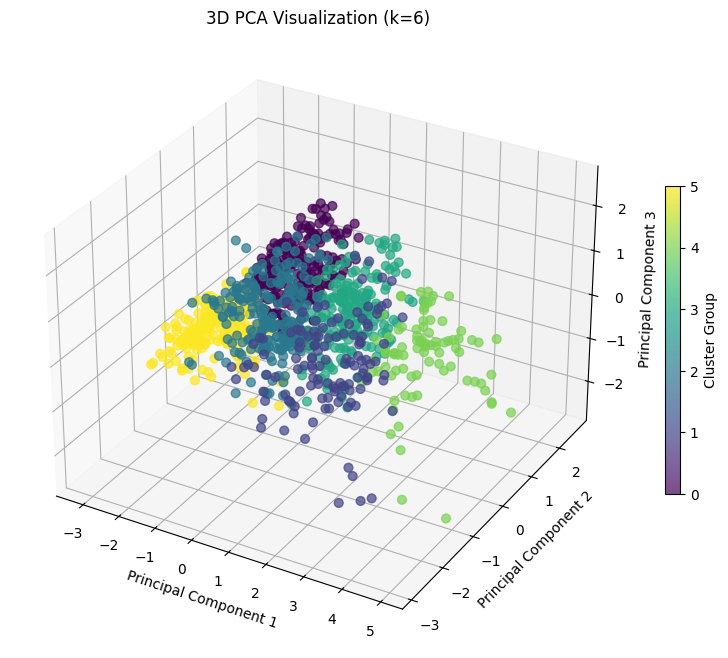



=== 7개의 centroid 결과 분석 ===
Silhouette Score: 0.2897
PCA 설명력(누적): 0.98


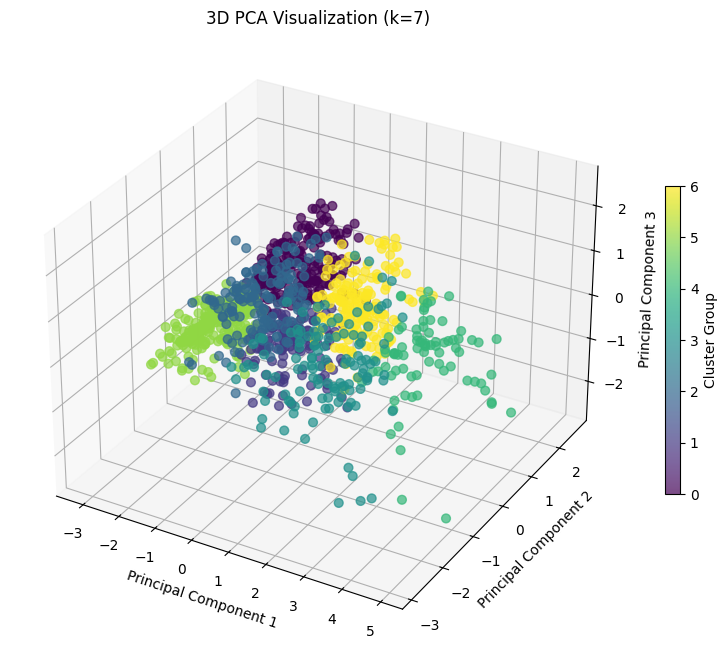



=== 8개의 centroid 결과 분석 ===
Silhouette Score: 0.2786
PCA 설명력(누적): 0.98


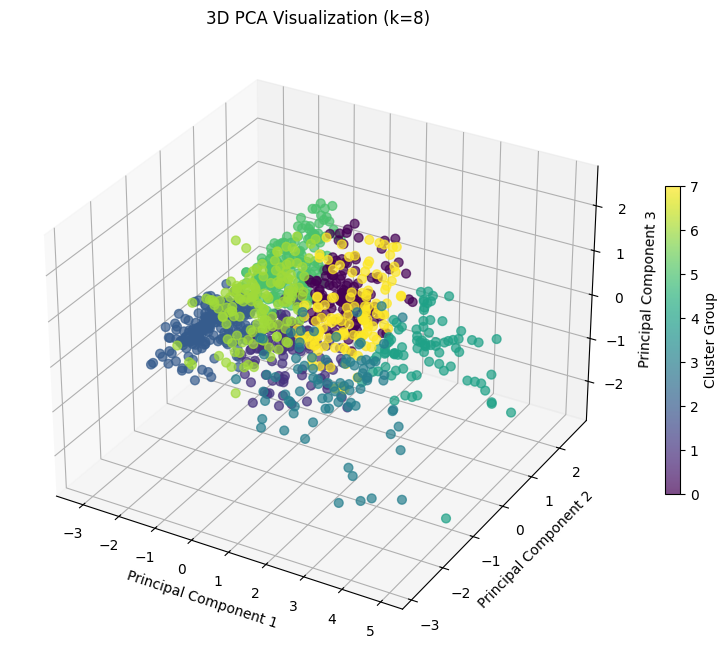



=== 9개의 centroid 결과 분석 ===
Silhouette Score: 0.2515
PCA 설명력(누적): 0.98


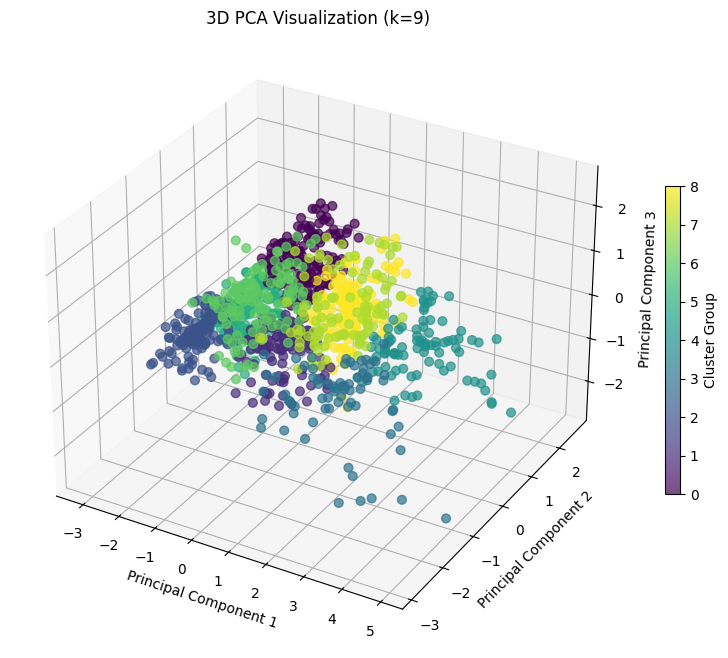



=== 10개의 centroid 결과 분석 ===
Silhouette Score: 0.2336
PCA 설명력(누적): 0.98


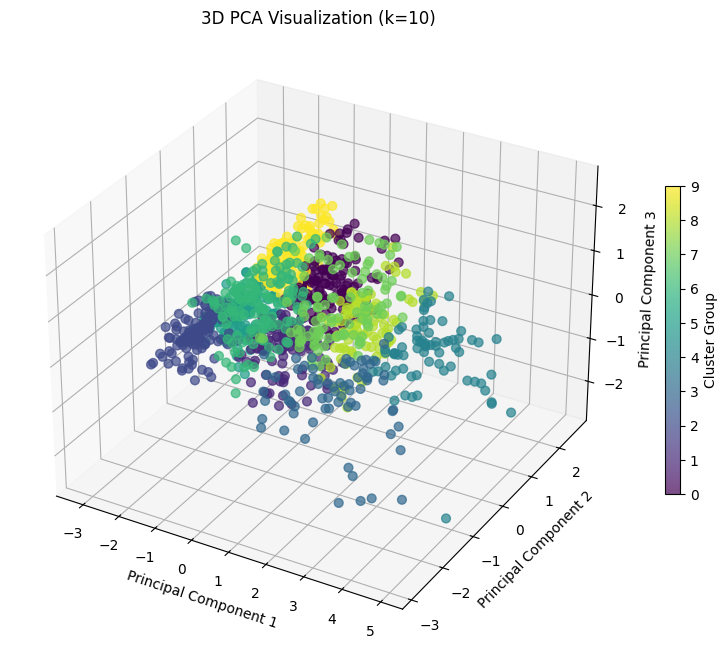



=== 11개의 centroid 결과 분석 ===
Silhouette Score: 0.2373
PCA 설명력(누적): 0.98


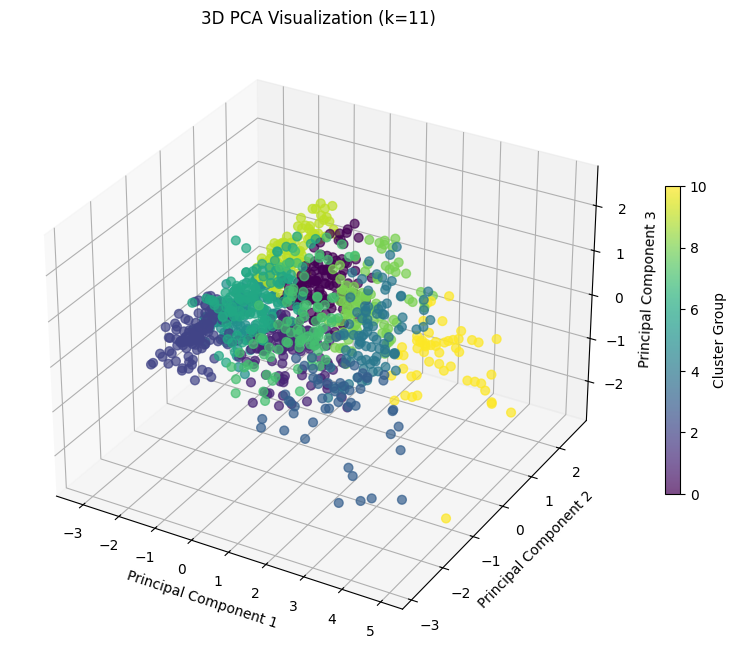

In [ ]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# 3D 그래프를 위한 필수 import
from mpl_toolkits.mplot3d import Axes3D

# --- 기존 데이터 전처리 부분 유지 ---
X = df1_cluster # 데이터프레임 변수명 확인 필요
X = np.log1p(X)
scaler = StandardScaler()
X = scaler.fit_transform(X)

# --- 반복문 시작 ---
for k in range(2, 12):
    print(f"=== {k}개의 centroid 결과 분석 ===")

    # 1. K-means 학습
    kmeans = KMeans(n_clusters=k, random_state=0, n_init="auto").fit(X)
    target = kmeans.labels_

    # 실루엣 점수 출력
    score = silhouette_score(X, target)
    print(f"Silhouette Score: {score:.4f}")

    # -------------------------------------------------------
    # 2. PCA로 3차원 축소 (n_components=3)
    pca = PCA(n_components=3)
    X_pca = pca.fit_transform(X)

    # 설명력 확인 (3개의 축이 전체 데이터를 얼마나 설명하는지)
    print(f"PCA 설명력(누적): {sum(pca.explained_variance_ratio_):.2f}")

    # 3. 3D 시각화
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')

    # x=PC1, y=PC2, z=PC3
    # c=target (군집별 색상), s=크기, alpha=투명도
    sc = ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2],
                    c=target, cmap='viridis', s=40, alpha=0.7)

    ax.set_xlabel('Principal Component 1')
    ax.set_ylabel('Principal Component 2')
    ax.set_zlabel('Principal Component 3')
    ax.set_title(f'3D PCA Visualization (k={k})')

    # 컬러바 추가
    plt.colorbar(sc, label='Cluster Group', shrink=0.5)
    plt.show()
    # -------------------------------------------------------
    print("\n")

In [ ]:
# DBSCAN 클러스터링 이용


In [ ]:
# 급식식단정보 csv Dataframe 분석
df2 = pd.read_csv('/content/fooddata.csv', encoding='cp949')
df2.head()

FileNotFoundError: [Errno 2] No such file or directory: '/content/fooddata.csv'

In [ ]:
df2['영양정보'][0]

In [ ]:
# 연령대별 아침식사 결식률 추이(1998 ~ 2023) 분석
df3 = pd.read_csv('/content/age_breakfast_lack.csv', encoding='cp949')
df3.head()

In [ ]:
df3_0_10 = df3.iloc[:, 0:10]
df3_10_20 = df3.iloc[:, 10:20]
df3_20_30 = df3.iloc[:, 20:30]
df3_30_40 = df3.iloc[:, 30:40]
df3_40_50 = df3.iloc[:, 40:50]
df3_50_60 = df3.iloc[:, 50:60]
df3_60_70 = df3.iloc[:, 60:]
display(df3_0_10.head())
display(df3_10_20.head())
display(df3_20_30.head())
display(df3_30_40.head())
display(df3_40_50.head())
display(df3_50_60.head())
display(df3_60_70.head())

**급식식단 영양성분만 + 결측치 행 삭제**



불러올 파일: /content/foodDB.csv
데이터 shape: (2794, 162)
컬럼 예시: ['식품코드', '식품명', '데이터구분코드', '데이터구분명', '식품기원코드', '식품기원명', '식품대분류코드', '식품대분류명', '대표식품코드', '대표식품명', '식품중분류코드', '식품중분류명', '식품소분류코드', '식품소분류명', '식품세분류코드']

선택된 9개 피처 컬럼명: ['탄수화물(g)', '단백질(g)', '지방(g)', '비타민 A(μg RAE)', '티아민(mg)', '리보플라빈(mg)', '비타민 C(mg)', '칼슘(mg)', '철(mg)']
PCA + 클러스터링에 사용할 데이터 shape: (2794, 9)
PCA 결과 차원 수: 7
PCA 누적 설명분산 비율: 0.90



=== k = 2 ===
실루엣 계수: 0.3435


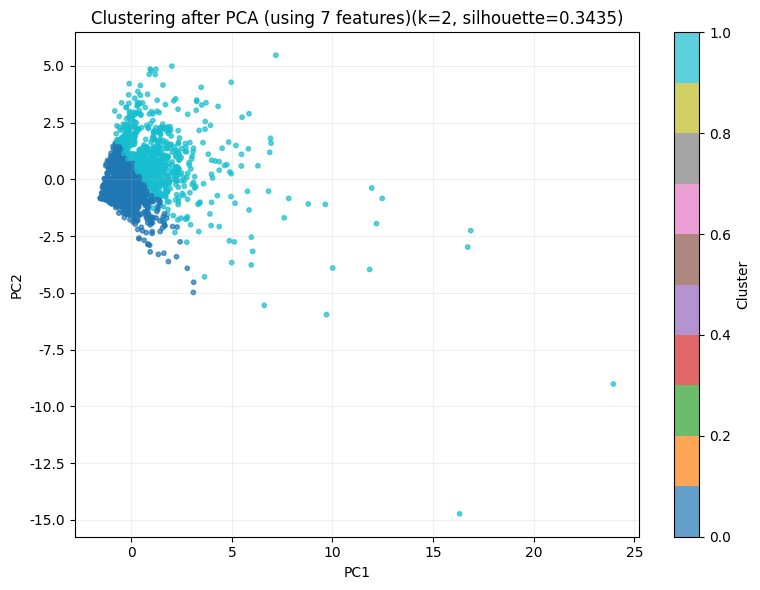


=== k = 3 ===
실루엣 계수: 0.3258


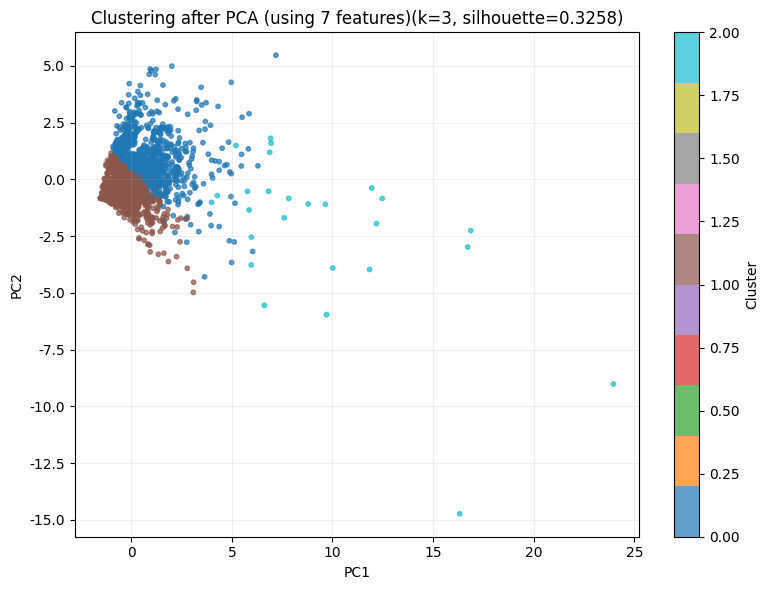


=== k = 4 ===
실루엣 계수: 0.3256


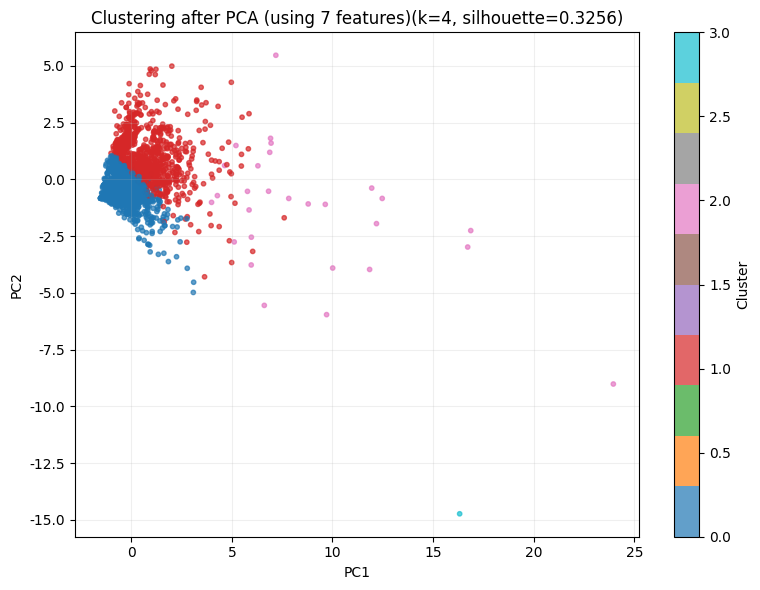


=== k = 5 ===
실루엣 계수: 0.3188


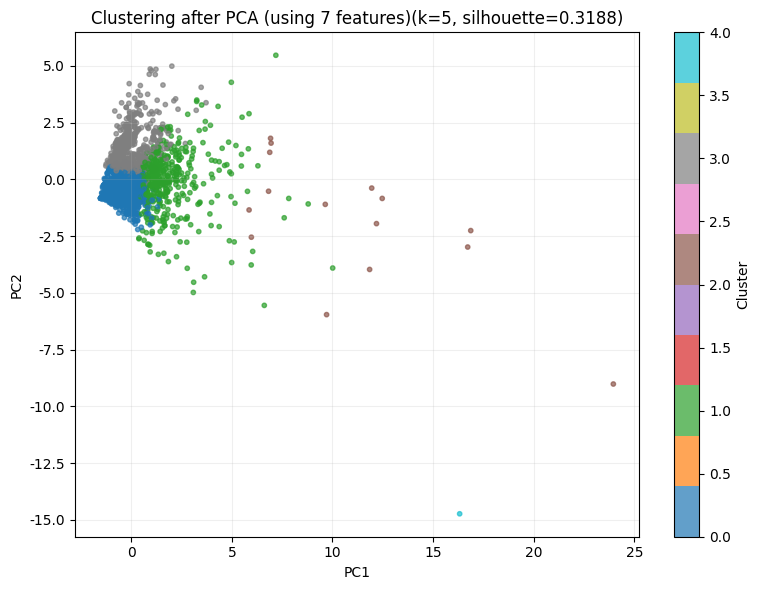


=== k = 6 ===
실루엣 계수: 0.3436


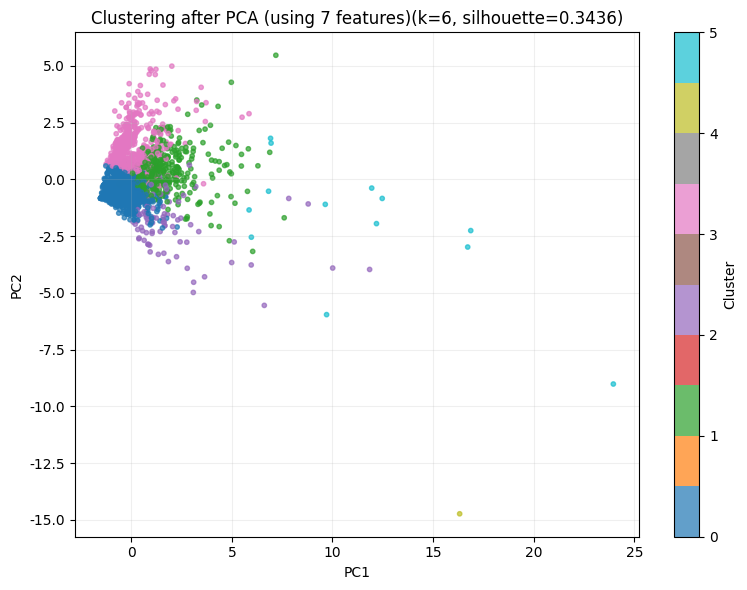


=== k = 7 ===
실루엣 계수: 0.3536


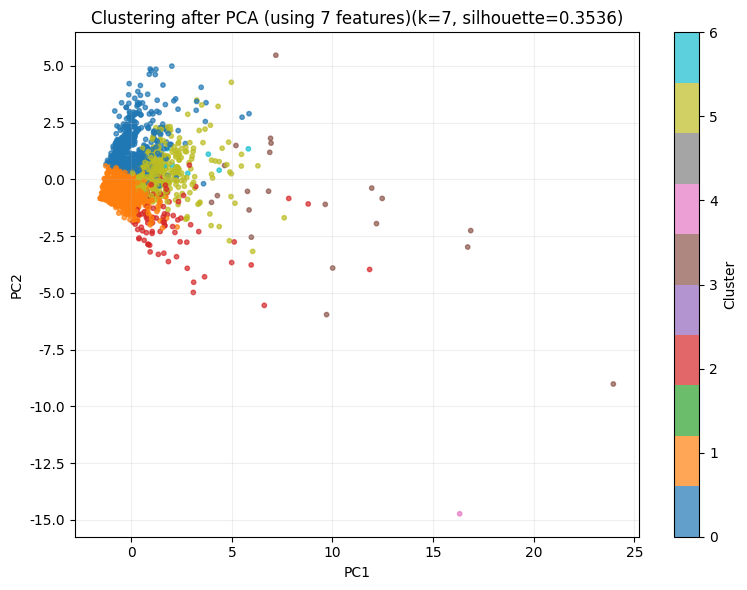


=== k = 8 ===
실루엣 계수: 0.3377


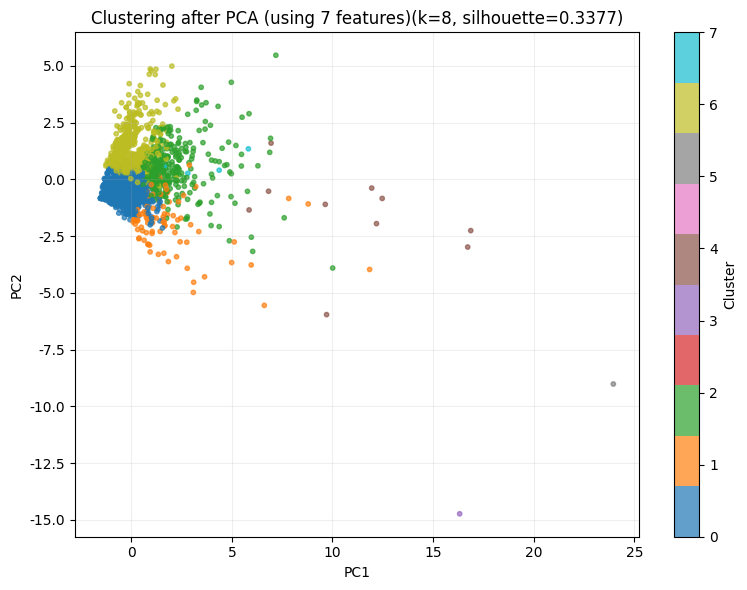


=== k = 9 ===
실루엣 계수: 0.3484


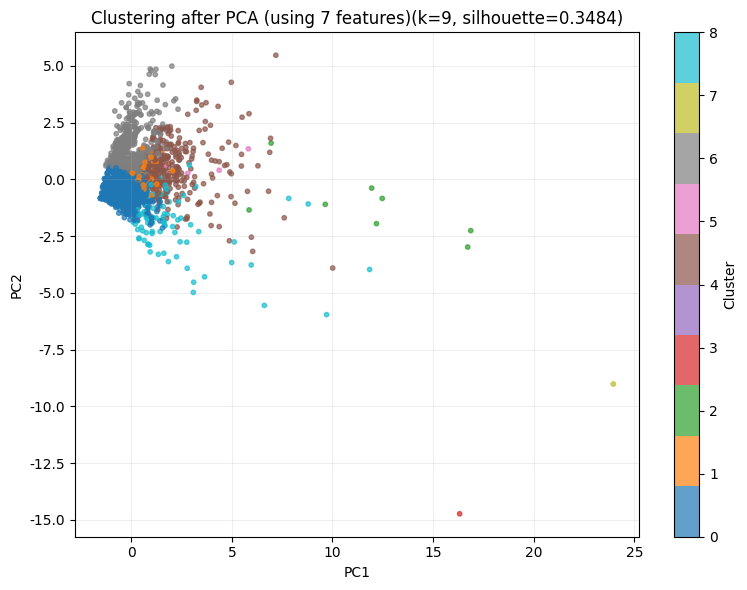


=== k = 10 ===
실루엣 계수: 0.3190


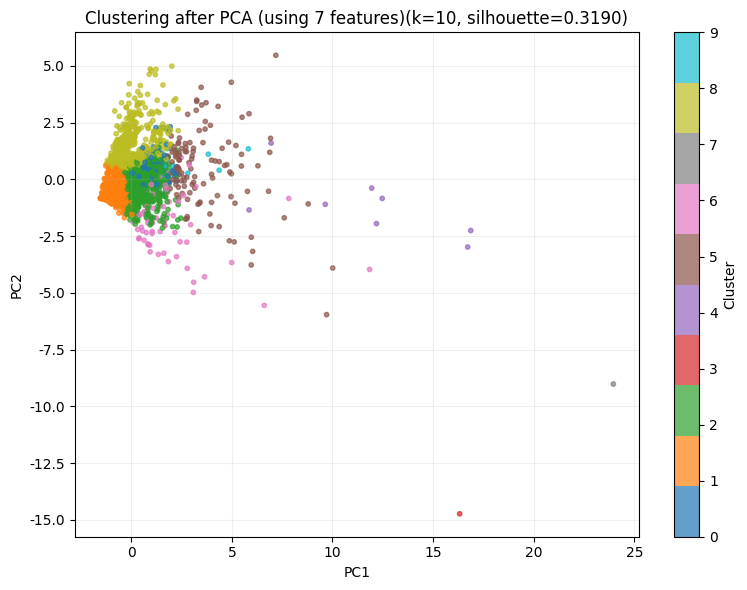


=== k = 11 ===
실루엣 계수: 0.3056


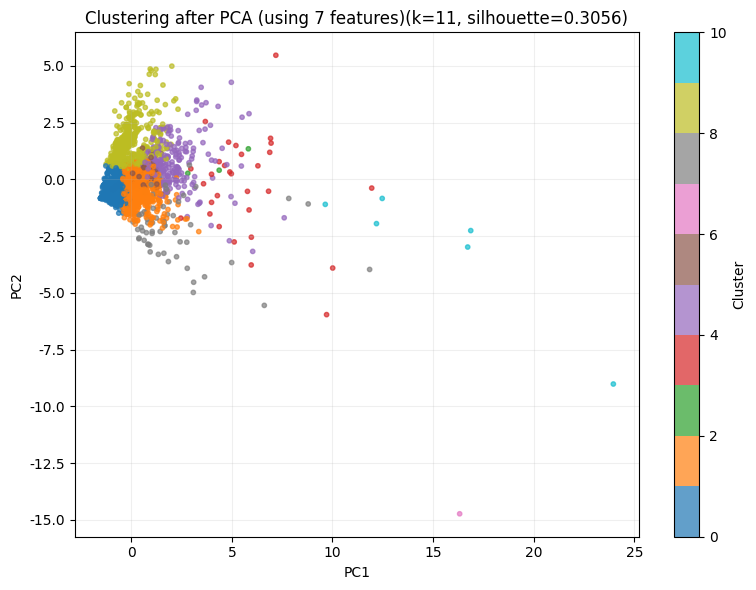

/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49892 (\N{HANGUL SYLLABLE SIL}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47336 (\N{HANGUL SYLLABLE RU}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 50659 (\N{HANGUL SYLLABLE ES}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 44228 (\N{HANGUL SYLLABLE GYE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49688 (\N{HANGUL SYLLABLE SU}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/loc

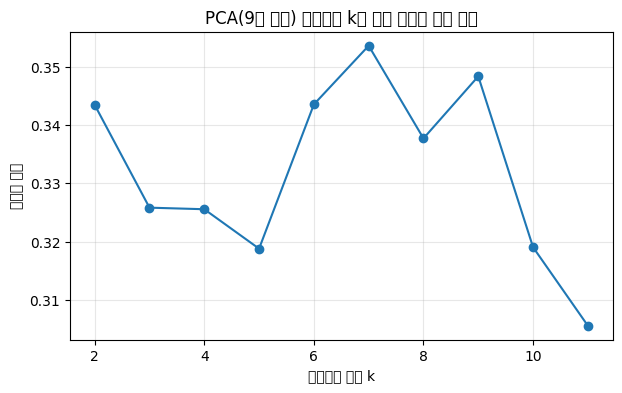

In [ ]:
# ======================================
# 0. 라이브러리 불러오기
# ======================================
import io
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# matplotlib 한글 폰트 설정
plt.rcParams['font.family'] = 'NanumBarunGothic'
plt.rcParams['axes.unicode_minus'] = False

from google.colab import files
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# ======================================
# 1. CSV 불러오기 (이미 Colab 환경에 foodDB.csv 파일이 존재함)
# ======================================
filename = '/content/foodDB.csv' # 파일 경로 지정
print("불러올 파일:", filename)

df = pd.read_csv(filename,
                 encoding="cp949",
                 low_memory=False)
print("데이터 shape:", df.shape)
print("컬럼 예시:", df.columns[:15].tolist())

# ======================================
# 2. 엑셀 열 문자 → 실제 컬럼 선택
#    (W, T, U, AE, AH, AI, AK, Z, AA)
# ======================================
def excel_col_to_index(col_letter: str) -> int:
    """엑셀 열 문자(A, B, ... Z, AA, AB, ...)를
       0부터 시작하는 인덱스로 바꿔주는 함수"""
    col_letter = col_letter.upper()
    result = 0
    for ch in col_letter:
        result = result * 26 + (ord(ch) - ord('A') + 1)
    return result - 1  # 0-based index

target_letters = ['W', 'T', 'U', 'AE', 'AH', 'AI', 'AK', 'Z', 'AA']  # 사용할 열들
target_indices = [excel_col_to_index(c) for c in target_letters]

# 실제 컬럼명 확인
nutrient_cols = [df.columns[i] for i in target_indices]
print("\n선택된 9개 피처 컬럼명:", nutrient_cols)

# 이 9개 컬럼만 사용
X = df[nutrient_cols].copy()

# 숫자로 변환 (문자 -> NaN)
X = X.apply(pd.to_numeric, errors="coerce")

# 전부 NaN인 행 제거
X = X.dropna(how="all")

# 나머지 NaN은 0으로 채우기
X = X.fillna(0)

print("PCA + 클러스터링에 사용할 데이터 shape:", X.shape)

# ======================================
# 3. 스케일링 → PCA 차원 축소 (2차원)
# ======================================
scaler = StandardScaler()

X_scaled = scaler.fit_transform(X)

pca = PCA(n_components=0.9)  # 최적: 7차원으로 축소
X_pca = pca.fit_transform(X_scaled)

print(f"PCA 결과 차원 수: {X_pca.shape[1]}")
print(f"PCA 누적 설명분산 비율: {pca.explained_variance_ratio_.sum():.2f}")

# 2D 시각화용 PC1, PC2
pc1 = X_pca[:, 0]
pc2 = X_pca[:, 1]

# ======================================
# 4. k = 2 ~ 11 각각에 대해
#    실루엣 계수 계산 + 시각화
# ======================================
k_range = range(2, 12)  # 2 ~ 11
scores = []

for k in k_range:
    # 4-1. K-means (PCA 공간에서)
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    labels = kmeans.fit_predict(X_pca)

    # 4-2. 실루엣 계수 계산
    score = silhouette_score(X_pca, labels)
    scores.append(score)
    print(f"\n=== k = {k} ===")
    print(f"실루엣 계수: {score:.4f}")

    # 4-3. 2D 시각화 (PC1 vs PC2)
    plt.figure(figsize=(8, 6))
    scatter = plt.scatter(
        pc1, pc2,
        c=labels,
        cmap="tab10",
        s=10,
        alpha=0.7
    )
    plt.xlabel("PC1")
    plt.ylabel("PC2")
    plt.title(f"Clustering after PCA (using 7 features)(k={k}, silhouette={score:.4f})")
    plt.colorbar(scatter, label="Cluster")
    plt.grid(alpha=0.2)
    plt.tight_layout()
    plt.show()

# ======================================
# 5. k별 실루엣 계수 변화 한 번에 보기
# ======================================
plt.figure(figsize=(7,4))
plt.plot(list(k_range), scores, marker="o")
plt.xlabel("클러스터 개수 k")
plt.ylabel("실루엣 계수")
plt.title("PCA(9개 피처) 공간에서 k에 따른 실루엣 계수 변화")
plt.grid(alpha=0.3)
plt.show()



In [ ]:
import joblib
from google.colab import files

# ======================================
# 0. 라이브러리 불러오기
# ======================================
import io
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from google.colab import files
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# ======================================
# 1. CSV 불러오기 (이미 Colab 환경에 foodDB.csv 파일이 존재함)
# ======================================
filename = '/content/foodDB.csv' # 파일 경로 지정
print("불러올 파일:", filename)

df = pd.read_csv(filename,
                 encoding="cp949",
                 low_memory=False)
print("데이터 shape:", df.shape)
print("컬럼 예시:", df.columns[:15].tolist())

# ======================================
# 2. 엑셀 열 문자 → 실제 컬럼 선택
#    (W, T, U, AE, AH, AI, AK, Z, AA)
# ======================================
def excel_col_to_index(col_letter: str) -> int:
    """엑셀 열 문자(A, B, ... Z, AA, AB, ...)를
       0부터 시작하는 인덱스로 바꿔주는 함수"""
    col_letter = col_letter.upper()
    result = 0
    for ch in col_letter:
        result = result * 26 + (ord(ch) - ord('A') + 1)
    return result - 1  # 0-based index

target_letters = ['W', 'T', 'U', 'AE', 'AH', 'AI', 'AK', 'Z', 'AA']  # 사용할 열들
target_indices = [excel_col_to_index(c) for c in target_letters]

# 실제 컬럼명 확인
nutrient_cols = [df.columns[i] for i in target_indices]
print("\n선택된 9개 피처 컬럼명:", nutrient_cols)

# 이 9개 컬럼만 사용
X = df[nutrient_cols].copy()

# 숫자로 변환 (문자 -> NaN)
X = X.apply(pd.to_numeric, errors="coerce")

# 전부 NaN인 행 제거
X = X.dropna(how="all")

# 나머지 NaN은 0으로 채우기
X = X.fillna(0)

print("PCA + 클러스터링에 사용할 데이터 shape:", X.shape)

# ======================================
# 3. 스케일링 → PCA 차원 축소 (2차원)
# ======================================
scaler = StandardScaler()

X_scaled = scaler.fit_transform(X)

pca = PCA(n_components=0.9)  # 최적: 7차원으로 축소
X_pca = pca.fit_transform(X_scaled)

kmeans = KMeans(n_clusters=7, random_state=42, n_init=10)
labels = kmeans.fit_predict(X_pca)




# 1. 모델 저장 (예: kmeans_model 변수)
joblib.dump(kmeans, 'kmeans_model.pkl')

# 2. 스케일러 저장 (예: scaler 변수)
# 만약 전처리를 안 했다면 이 단계는 생략 가능하지만, 보통은 필수입니다.
joblib.dump(scaler, 'scaler.pkl')

# 3. 로컬 컴퓨터로 다운로드
files.download('kmeans_model.pkl')
files.download('scaler.pkl')

불러올 파일: /content/foodDB.csv


FileNotFoundError: [Errno 2] No such file or directory: '/content/foodDB.csv'

불러올 파일: /content/sample_data/foodDB.csv
데이터 shape: (2794, 162)
컬럼 예시: ['식품코드', '식품명', '데이터구분코드', '데이터구분명', '식품기원코드', '식품기원명', '식품대분류코드', '식품대분류명', '대표식품코드', '대표식품명', '식품중분류코드', '식품중분류명', '식품소분류코드', '식품소분류명', '식품세분류코드']

선택된 9개 피처 컬럼명: ['탄수화물(g)', '단백질(g)', '지방(g)', '비타민 A(μg RAE)', '티아민(mg)', '리보플라빈(mg)', '비타민 C(mg)', '칼슘(mg)', '철(mg)']
PCA + 클러스터링에 사용할 데이터 shape: (2794, 9)
PCA 결과 차원 수: 7
PCA 누적 설명분산 비율: 0.94



=== k = 2 ===
실루엣 계수: 0.2843


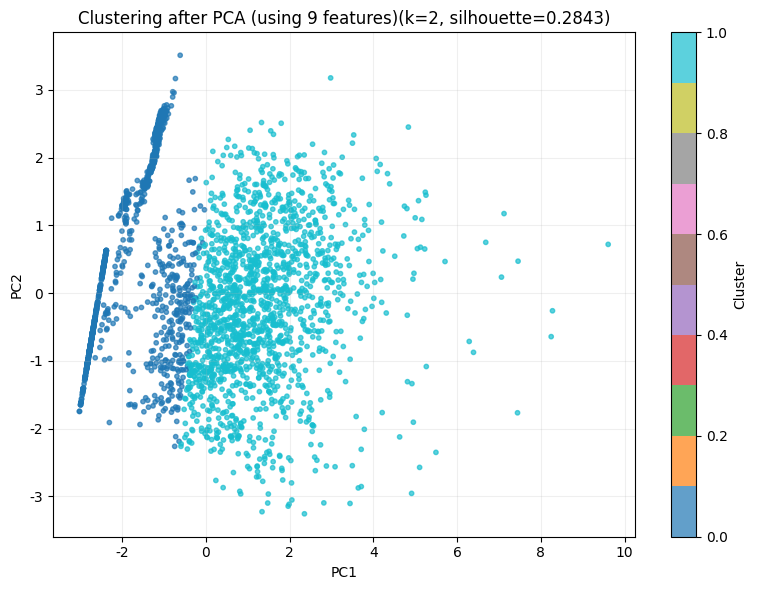


=== k = 3 ===
실루엣 계수: 0.2722


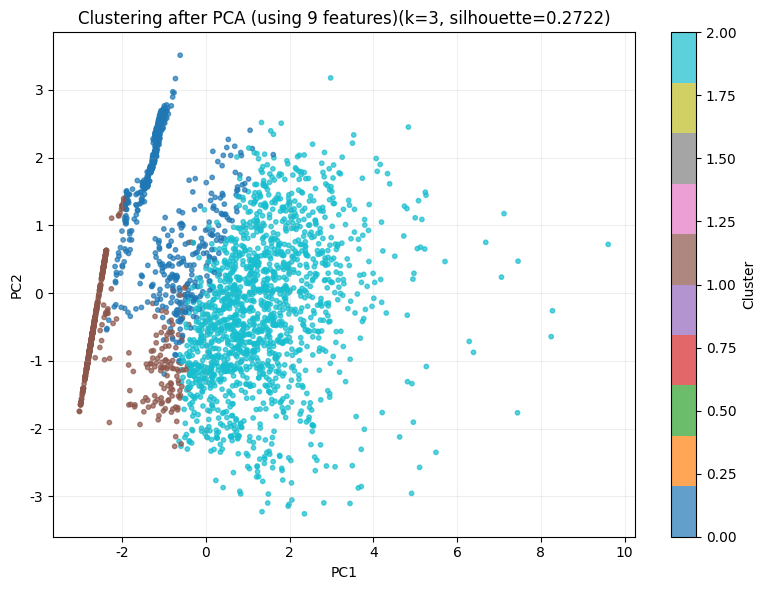


=== k = 4 ===
실루엣 계수: 0.3046


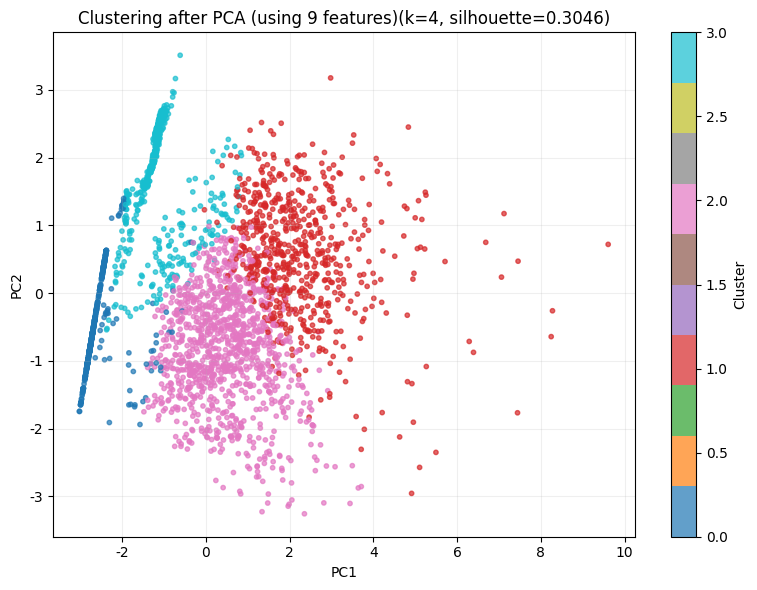


=== k = 5 ===
실루엣 계수: 0.3126


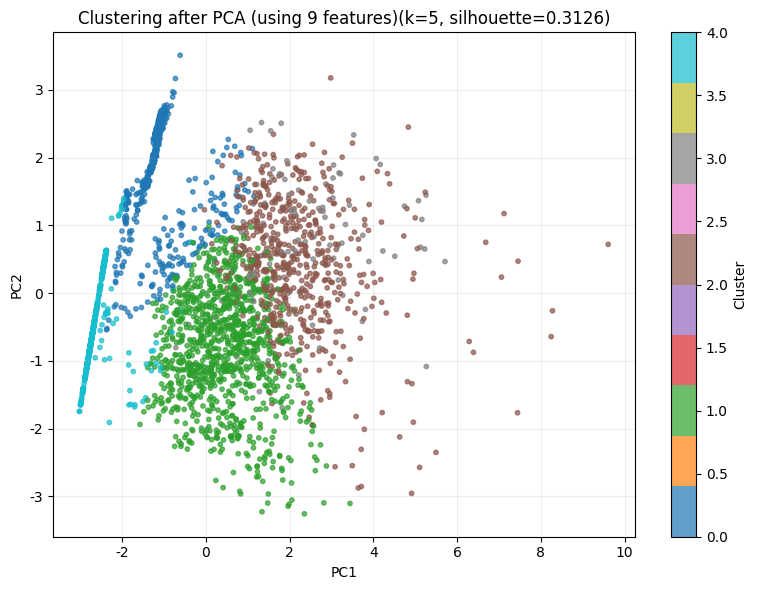


=== k = 6 ===
실루엣 계수: 0.3016


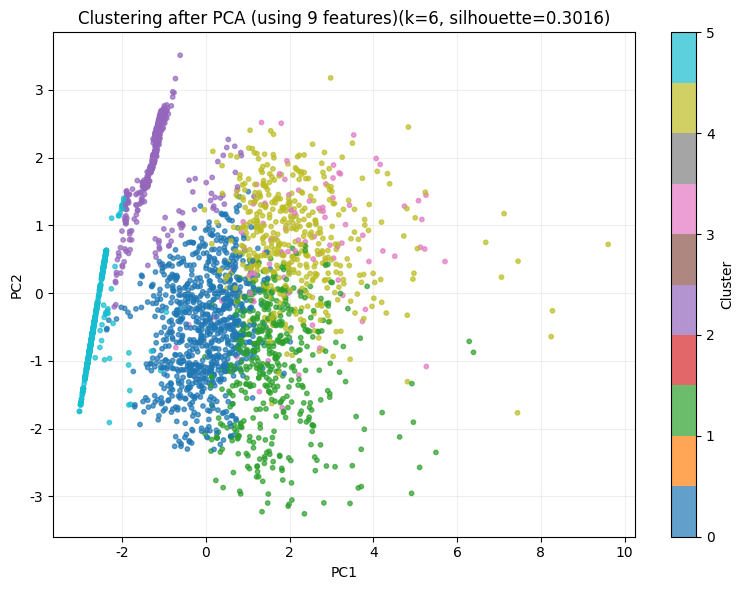


=== k = 7 ===
실루엣 계수: 0.2998


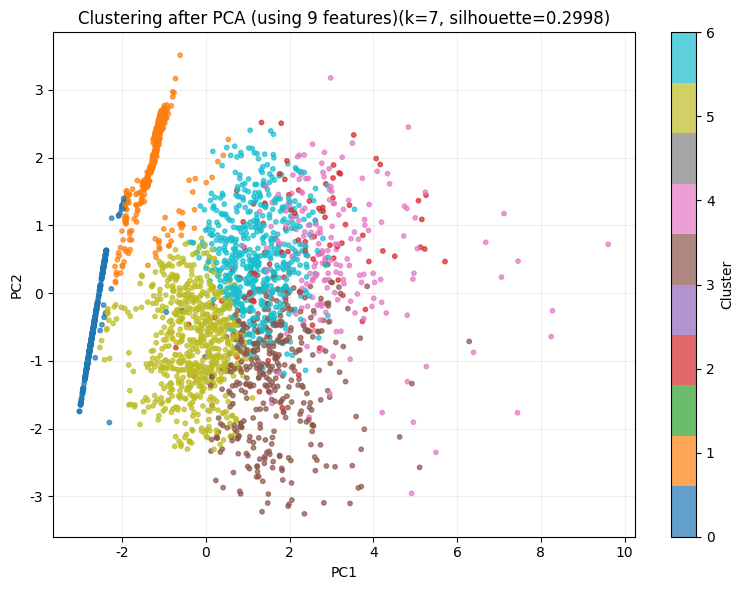


=== k = 8 ===
실루엣 계수: 0.3050


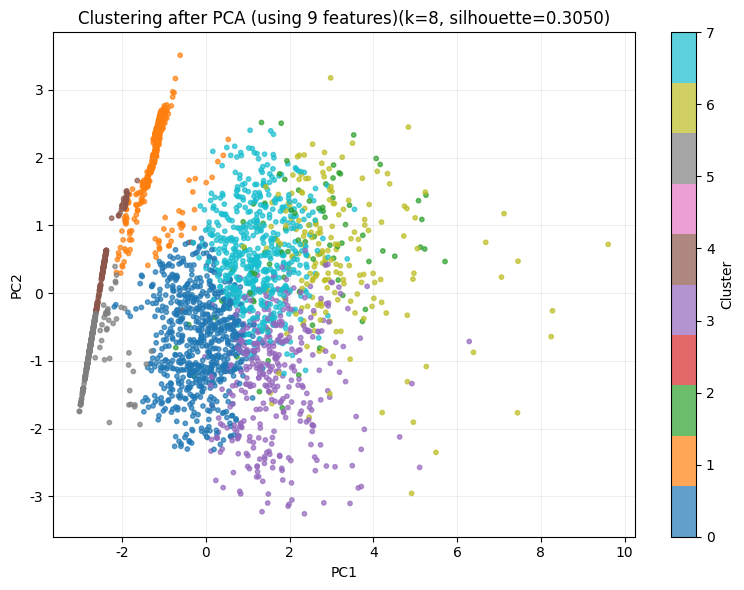


=== k = 9 ===
실루엣 계수: 0.3088


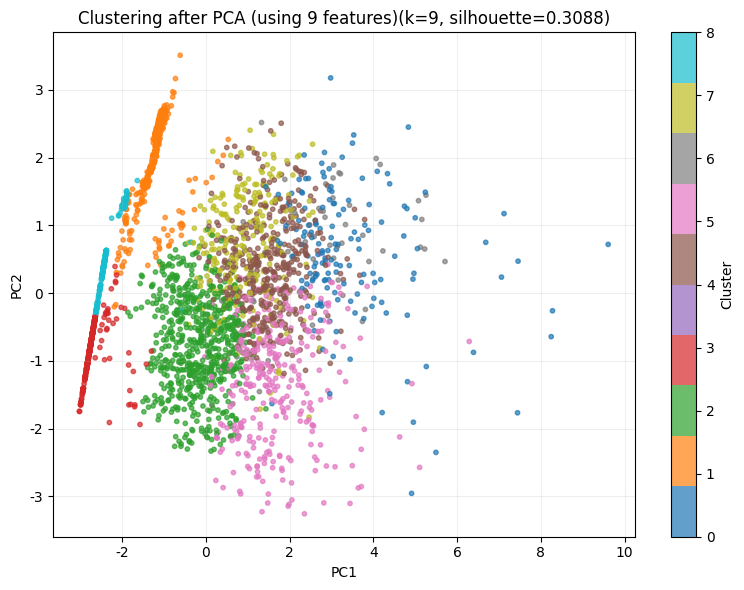


=== k = 10 ===
실루엣 계수: 0.3091


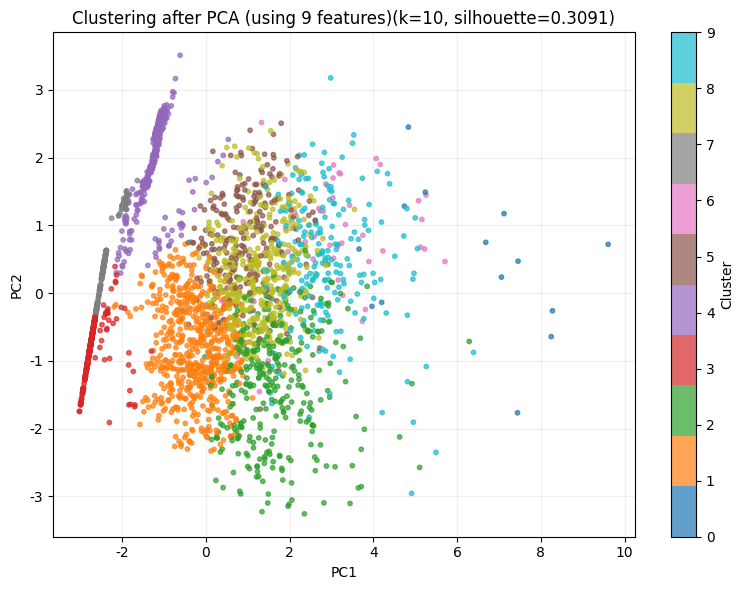


=== k = 11 ===
실루엣 계수: 0.2976


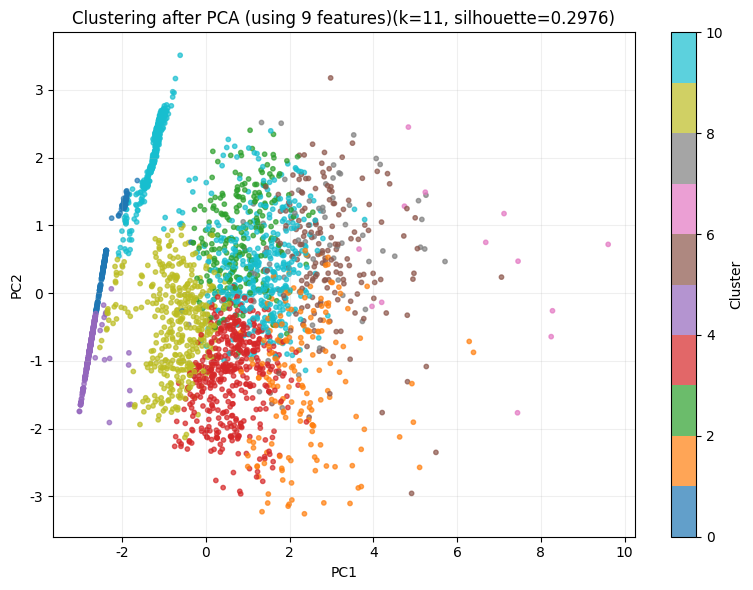

/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49892 (\N{HANGUL SYLLABLE SIL}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47336 (\N{HANGUL SYLLABLE RU}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 50659 (\N{HANGUL SYLLABLE ES}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 44228 (\N{HANGUL SYLLABLE GYE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49688 (\N{HANGUL SYLLABLE SU}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/loc

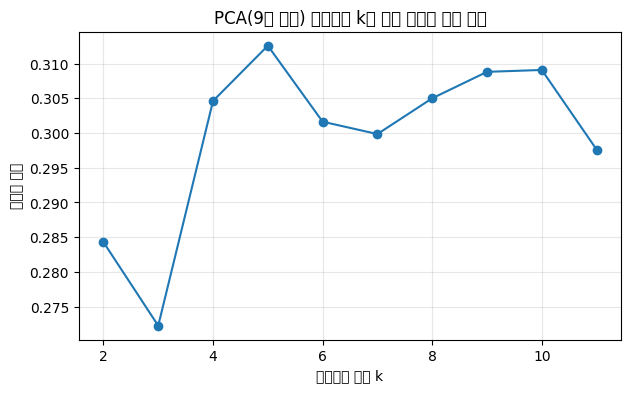

In [ ]:

# ======================================
# 0. 라이브러리 불러오기
# ======================================
import io
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# matplotlib 한글 폰트 설정
plt.rcParams['font.family'] = 'NanumBarunGothic'
plt.rcParams['axes.unicode_minus'] = False

from google.colab import files
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# ======================================
# 1. CSV 불러오기 (이미 Colab 환경에 foodDB.csv 파일이 존재함)
# ======================================
filename = '/content/sample_data/foodDB.csv' # 파일 경로 지정
print("불러올 파일:", filename)

df = pd.read_csv(filename,
                 encoding="cp949",
                 low_memory=False)
print("데이터 shape:", df.shape)
print("컬럼 예시:", df.columns[:15].tolist())

# ======================================
# 2. 엑셀 열 문자 → 실제 컬럼 선택
#    (W, T, U, AE, AH, AI, AK, Z, AA)
# ======================================
def excel_col_to_index(col_letter: str) -> int:
    """엑셀 열 문자(A, B, ... Z, AA, AB, ...)를
       0부터 시작하는 인덱스로 바꿔주는 함수"""
    col_letter = col_letter.upper()
    result = 0
    for ch in col_letter:
        result = result * 26 + (ord(ch) - ord('A') + 1)
    return result - 1  # 0-based index

target_letters = ['W', 'T', 'U', 'AE', 'AH', 'AI', 'AK', 'Z', 'AA']  # 사용할 열들
target_indices = [excel_col_to_index(c) for c in target_letters]

# 실제 컬럼명 확인
nutrient_cols = [df.columns[i] for i in target_indices]
print("\n선택된 9개 피처 컬럼명:", nutrient_cols)

# 이 9개 컬럼만 사용
X = df[nutrient_cols].copy()

# 숫자로 변환 (문자 -> NaN)
X = X.apply(pd.to_numeric, errors="coerce")

# 전부 NaN인 행 제거
X = X.dropna(how="all")

# 나머지 NaN은 0으로 채우기
X = X.fillna(0)

X = np.log1p(X)

print("PCA + 클러스터링에 사용할 데이터 shape:", X.shape)

# ======================================
# 3. 스케일링 → PCA 차원 축소 (2차원)
# ======================================
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

pca = PCA(n_components=0.9)  # 최적: 7차원으로 축소
X_pca = pca.fit_transform(X_scaled)

print(f"PCA 결과 차원 수: {X_pca.shape[1]}")
print(f"PCA 누적 설명분산 비율: {pca.explained_variance_ratio_.sum():.2f}")

# 2D 시각화용 PC1, PC2
pc1 = X_pca[:, 0]
pc2 = X_pca[:, 1]

# ======================================
# 4. k = 2 ~ 11 각각에 대해
#    실루엣 계수 계산 + 시각화
# ======================================
k_range = range(2, 12)  # 2 ~ 11
scores = []

for k in k_range:
    # 4-1. K-means (PCA 공간에서)
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    labels = kmeans.fit_predict(X_pca)

    # 4-2. 실루엣 계수 계산
    score = silhouette_score(X_pca, labels)
    scores.append(score)
    print(f"\n=== k = {k} ===")
    print(f"실루엣 계수: {score:.4f}")

    # 4-3. 2D 시각화 (PC1 vs PC2)
    plt.figure(figsize=(8, 6))
    scatter = plt.scatter(
        pc1, pc2,
        c=labels,
        cmap="tab10",
        s=10,
        alpha=0.7
    )
    plt.xlabel("PC1")
    plt.ylabel("PC2")
    plt.title(f"Clustering after PCA (using 9 features)(k={k}, silhouette={score:.4f})")
    plt.colorbar(scatter, label="Cluster")
    plt.grid(alpha=0.2)
    plt.tight_layout()
    plt.show()

# ======================================
# 5. k별 실루엣 계수 변화 한 번에 보기
# ======================================
plt.figure(figsize=(7,4))
plt.plot(list(k_range), scores, marker="o")
plt.xlabel("클러스터 개수 k")
plt.ylabel("실루엣 계수")
plt.title("PCA(9개 피처) 공간에서 k에 따른 실루엣 계수 변화")
plt.grid(alpha=0.3)
plt.show()